<a href="https://www.kaggle.com/code/babaksh/googlestocklstm-pytorch?scriptVersionId=229889282" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

# Introduction

This notebook aims to predict Google stock prices using Long Short-Term Memory (LSTM) neural networks. It explores multiple configurations by incorporating Simple Moving Averages (SMAs) of different window sizes as features to enhance predictive performance. The analysis compares:

- A baseline model using raw price data (no SMAs).
- Models with individual SMAs (5, 7, 9, 11, 13, 15, 17 days).
- A model with all SMAs combined.
- Combinations of the best-performing SMAs.

The goal is to assess how these configurations impact prediction accuracy and forecast stock prices for the next 10 days.

# Required Libraries

The following libraries are essential for this project:

- **PyTorch (`torch`)**: Core library for building and training LSTM neural networks.
- **PyTorch Neural Network (`torch.nn`)**: Provides neural network components like LSTM layers.
- **PyTorch Optimizer (`torch.optim`)**: Implements optimization algorithms (e.g., Adam) for training.
- **PyTorch Data Utilities (`torch.utils.data`)**: Includes `DataLoader` and `TensorDataset` for efficient data handling.
- **NumPy**: Handles numerical computations.
- **Pandas**: Manages data manipulation and preprocessing.
- **yfinance**: Typically fetches stock data.
- **datetime**: Processes date and time data.
- **Matplotlib**: Creates static visualizations.
- **Plotly**: Generates interactive charts.
- **IPython.display**: Enhances notebook output with HTML and display utilities.
- **Scikit-learn**: Provides tools for scaling data (`MinMaxScaler`) and calculating evaluation metrics (`mean_absolute_error`, `mean_squared_error`, `r2_score`, `mean_absolute_percentage_error`).

These libraries enable data handling, model development with PyTorch, and result visualization.

In [1]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
import numpy as np
import pandas as pd
import yfinance as yf
from datetime import datetime
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from IPython.display import HTML, display
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score, mean_absolute_percentage_error

# Configurations

Key hyperparameters and settings guide the modeling process:

- **EPOCH**: 700 training iterations.
- **RATIO**: 80% training data, 20% testing data (0.8).
- **WINDOW_SIZE**: Default SMA window (21 days), used in Bollinger Bands.
- **NUM_STD**: 4 standard deviations for Bollinger Bands.
- **BATCH_SIZE**: 128 samples per gradient update.
- **LSTM_UNIT**: 70 units in the first LSTM layer.
- **DROPOUT_RATE**: 30% dropout to prevent overfitting.
- **FUTURE_DAYS**: 10 days for future predictions.
- **SEQ_LENGTH**: 45-days input sequences for LSTM.
- **target_col**: 'Close' (target variable).
- **L2_REGULARIZER**: 0.0001 L2 regularization in LSTM model.

These settings ensure consistency across data preparation, model architecture, and training.

In [2]:
# Configs
EPOCH = 700
RATIO = 0.8
WINDOW_SIZE = 21
NUM_STD = 4
BATCH_SIZE = 128
LSTM_UNIT = 70
DROPOUT_RATE = 0.3
FUTURE_DAYS = 10
SEQ_LENGTH = 45  # Use 45 days to predict the next day
target_col = 'Close'
LEARNING_RATE = 0.001
L2_REGULARIZER = 0.0001
today = datetime.today()
PATIENCE = 100
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")  # GPU support

# Data Preprocessing and Visualization

## Data Preprocessing

This section prepares the Google stock dataset:

- **Loading Data**: Data is loaded from `Google_2025.csv`.
- **Future Data**: The last 10 rows are reserved for future prediction evaluation.
- **Date Handling**: 'Date' column is converted to datetime format.
- **Calculating SMAs**: SMAs are computed for 5, 7, 9, 11, 13, 15, and 17 days.
- **Missing Values**: Initial SMA NaNs are filled with corresponding closing prices.
- **Column Removal**: Drops 'Dividends', 'Stock Splits', and 'Volume'.

In [3]:
# Load data
df = pd.read_csv('/kaggle/input/Google_2025-03-22.csv')
last_n_days_data = df.iloc[-FUTURE_DAYS:]  # Only the last FUTURE_DAYS rows
df = df.iloc[:-FUTURE_DAYS]  # All rows except the last FUTURE_DAYS

# Data cleaning
# Convert the datetime column to datetime object
df['Date'] = pd.to_datetime(df['Date'], utc=True)
last_n_days_data['Date'] = pd.to_datetime(last_n_days_data['Date'], utc=True)

# Extract the date part
df['Date'] = df['Date'].dt.date
last_n_days_data['Date'] = last_n_days_data['Date'].dt.date

df['Date'] = pd.to_datetime(df['Date'], format='%Y-%m-%d')
last_n_days_data['Date'] = pd.to_datetime(last_n_days_data['Date'], format='%Y-%m-%d')

df["5d_sma"] = df["Close"].rolling(5).mean()
df["7d_sma"] = df["Close"].rolling(7).mean()
df["9d_sma"] = df["Close"].rolling(9).mean()
df["11d_sma"] = df["Close"].rolling(11).mean()
df["13d_sma"] = df["Close"].rolling(13).mean()
df["15d_sma"] = df["Close"].rolling(15).mean()
df["17d_sma"] = df["Close"].rolling(17).mean()

# Check missing values
print(f"Missing values: {df.isnull().sum().sum()}")

Missing values: 70


In [4]:
df['5d_sma'] = df['5d_sma'].fillna(df['Close'])
df['7d_sma'] = df['7d_sma'].fillna(df['Close'])
df['9d_sma'] = df['9d_sma'].fillna(df['Close'])
df['11d_sma'] = df['11d_sma'].fillna(df['Close'])
df['13d_sma'] = df['13d_sma'].fillna(df['Close'])
df['15d_sma'] = df['15d_sma'].fillna(df['Close'])
df['17d_sma'] = df['17d_sma'].fillna(df['Close'])

# Check missing values after refinements
print(f"Missing values: {df.isnull().sum().sum()}")

Missing values: 0


In [5]:
plot_df = df[df['Date'] >= '2025-01-01']
plot_january = df[(df['Date'] >= '2025-01-01') & (df['Date'] <= '2025-01-31')]
plot_last_30_days = df.iloc[-30:]

df = df.drop('Dividends', axis=1)  # Remove constant column
df = df.drop('Stock Splits', axis=1)  # Remove constant column
df = df.drop('Volume', axis=1)  # Remove redundant column

last_n_days_data = last_n_days_data.drop('Dividends', axis=1)  # Remove constant column
last_n_days_data = last_n_days_data.drop('Stock Splits', axis=1)  # Remove constant column
last_n_days_data = last_n_days_data.drop('Volume', axis=1)  # Remove redundant column

In [6]:
print(df.tail(15))

           Date        Open        High         Low       Close      5d_sma  \
2293 2025-02-14  186.617401  187.935891  185.898219  186.657349  186.877097   
2294 2025-02-18  187.226695  187.566304  183.371087  185.588562  186.397644   
2295 2025-02-19  185.973121  187.146787  185.288903  186.917053  186.409628   
2296 2025-02-20  186.287772  186.907062  184.389940  186.427612  186.651355   
2297 2025-02-21  187.076861  187.256664  180.923882  181.373367  185.392789   
2298 2025-02-24  183.590841  184.879366  180.674166  180.983810  184.258081   
2299 2025-02-25  179.949986  180.554293  176.568844  177.168152  182.573999   
2300 2025-02-26  176.743646  177.877349  173.392453  174.501190  180.090826   
2301 2025-02-27  175.739787  176.389041  169.558825  170.016312  176.808566   
2302 2025-02-28  170.106204  172.303697  168.198374  172.024017  174.938696   
2303 2025-03-03  173.532301  174.800860  167.449235  168.468079  172.435550   
2304 2025-03-04  167.748890  174.965659  167.349336 

## Data Visualization

Visualizations explore stock price trends:

- **Historical Closing Prices**: Line plot of closing prices over time.
- **2025 Prices**: Plot of open, high, low, and close prices for 2025.
- **January 2025 Prices**: Focused view of January 2025.
- **Last 30 Days**: Recent price trends.
- **Candlestick Chart with SMAs**: Interactive Plotly chart of 2025 data with candlesticks and SMA overlays (5D to 17D).

These steps produce cleaned data and insightful visualizations.

In [7]:
def plot_historical_data(dataframe, title):
    plt.figure(figsize=(12, 6))
    plt.plot(dataframe['Date'], dataframe['Close'], label='Closing Price', color='blue')
    plt.plot(dataframe['Date'], dataframe['High'], label='High Price', color='green')
    plt.plot(dataframe['Date'], dataframe['Low'], label='Low Price', color='red')
    plt.plot(dataframe['Date'], dataframe['Open'], label='Opening Price', color='black')
    plt.title(title)
    plt.xlabel('Date')
    plt.ylabel('Price (USD)')
    plt.legend()
    plt.show()

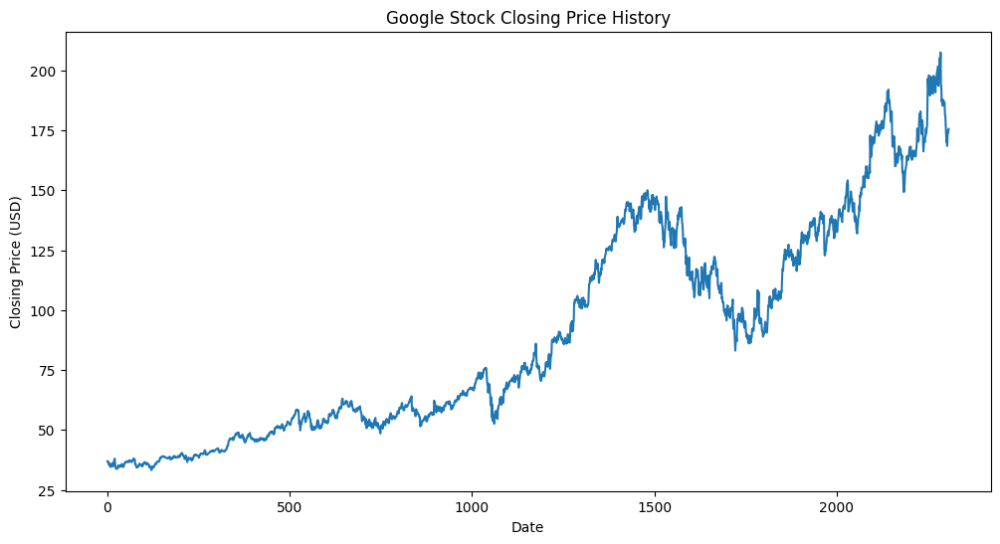

In [8]:
# Visualize closing price
plt.figure(figsize=(12, 6))
plt.plot(df['Close'])
plt.title('Google Stock Closing Price History')
plt.xlabel('Date')
plt.ylabel('Closing Price (USD)')
plt.show()

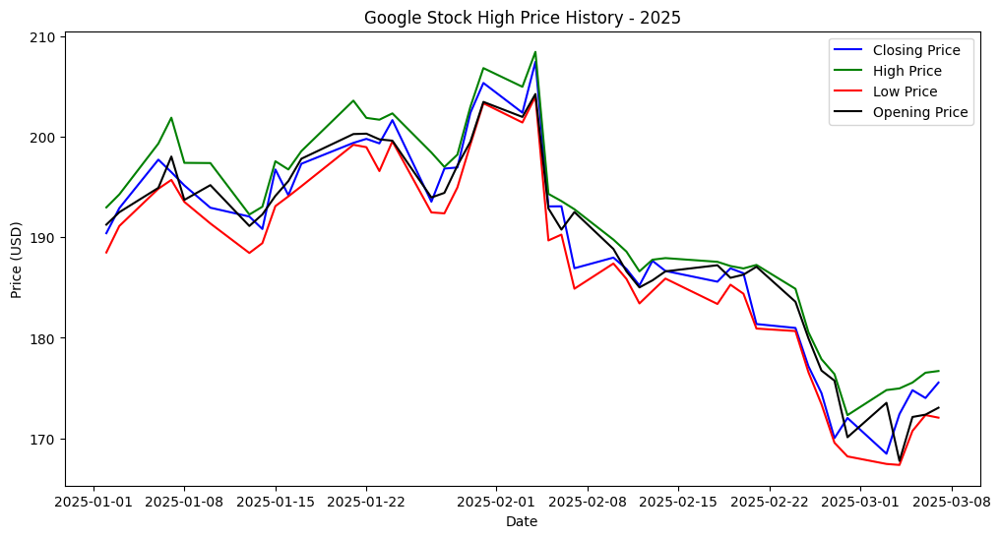

In [9]:
# Visualize 2025 price
plot_historical_data(plot_df, 'Google Stock High Price History - 2025')

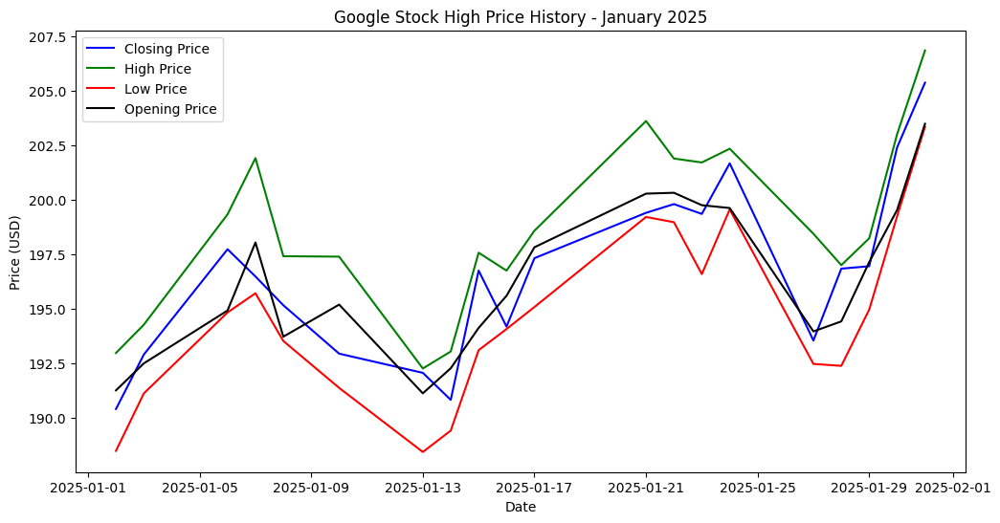

In [10]:
# Visualize Jan 2025 price
plot_historical_data(plot_january, 'Google Stock High Price History - January 2025')

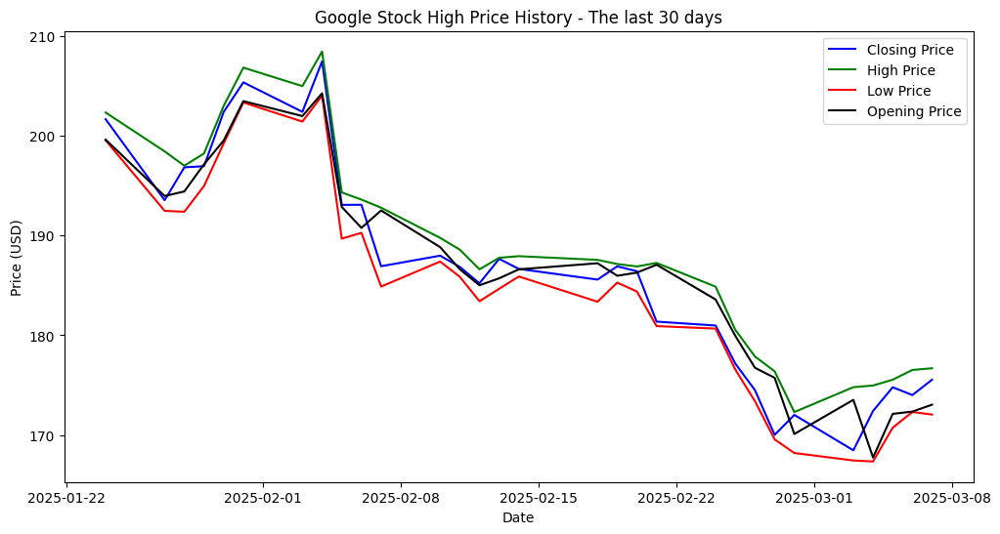

In [11]:
# Visualize Last 30 days price
plot_historical_data(plot_last_30_days, 'Google Stock High Price History - The last 30 days')

In [12]:
# Create the candlestick chart
fig = go.Figure(data=[go.Candlestick(
    x=plot_df['Date'],  # Date on the x-axis
    open=plot_df['Open'],  # Open prices
    high=plot_df['High'],  # High prices
    low=plot_df['Low'],  # Low prices
    close=plot_df['Close'],  # Close prices
    name='Google Stock Market in 2025'
)])

# Customize the layout
fig.update_layout(
    title='Google Stock Price History - 2025',
    xaxis_title='Date',
    yaxis_title='Price (USD)',
    xaxis_rangeslider_visible=False
)
fig.add_trace(go.Scatter(x=plot_df['Date'], y=plot_df['Close'], line_color='green', name='Close', mode='lines'))
fig.add_trace(go.Scatter(x=plot_df['Date'], y=plot_df['5d_sma'], line_color='yellow', name='5D-SMA', mode='lines'))
fig.add_trace(go.Scatter(x=plot_df['Date'], y=plot_df['7d_sma'], line_color='aqua', name='7D-SMA', mode='lines'))
fig.add_trace(go.Scatter(x=plot_df['Date'], y=plot_df['9d_sma'], line_color='red', name='9D-SMA', mode='lines'))
fig.add_trace(go.Scatter(x=plot_df['Date'], y=plot_df['11d_sma'], line_color='cyan', name='11D-SMA', mode='lines'))
fig.add_trace(go.Scatter(x=plot_df['Date'], y=plot_df['13d_sma'], line_color='darkgreen', name='5D-SMA', mode='lines'))
fig.add_trace(go.Scatter(x=plot_df['Date'], y=plot_df['15d_sma'], line_color='darkblue', name='7D-SMA', mode='lines'))
fig.add_trace(go.Scatter(x=plot_df['Date'], y=plot_df['17d_sma'], line_color='darkred', name='9D-SMA', mode='lines'))

# Show the plot
display(HTML(fig.to_html(include_plotlyjs=True)))

# Simple Data without SMA

This section creates a baseline LSTM model using raw price data:

- **Sequence Creation**: Generates 60-day sequences (X) and targets (y).
- **Feature Selection**:
  - Features: 'Open', 'High', 'Low', 'Close'.
  - Normalized using `MinMaxScaler` (0 to 1).
  - Split into 80% training, 20% testing sets.

The baseline excludes SMAs to evaluate performance without trend indicators.

In [13]:
# Create sequences
def create_sequences(data, seq_length, features):
    X, y = [], []
    for i in range(seq_length, len(data)):
        X.append(data[i-seq_length:i])
        y.append(data[i, features.index(target_col)])
    return torch.tensor(np.array(X), dtype=torch.float32), torch.tensor(np.array(y), dtype=torch.float32)

In [14]:
# Feature selection and normalization
def feature_selection(dataframe, features):
    scaler = MinMaxScaler(feature_range=(0,1))
    scaled_data = scaler.fit_transform(dataframe[features])
    
    X, y = create_sequences(scaled_data, SEQ_LENGTH, features)
    
    # Train-Test split
    train_size = int(RATIO * len(X))
    X_train, X_test = X[:train_size], X[train_size:]
    y_train, y_test = y[:train_size], y[train_size:]

    train_dataset = TensorDataset(X_train, y_train)
    test_dataset = TensorDataset(X_test, y_test)

    train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
    test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False)

    print(X_train.shape, X_test.shape)
    print(y_train.shape, y_test.shape)
    
    return train_loader, test_loader, X_train, X_test, y_train, y_test, scaler

In [15]:
# Feature selection and normalization
features_simple = ['Open', 'High', 'Low', 'Close']
train_loader_simple, test_loader_simple, X_train_simple, X_test_simple, y_train_simple, y_test_simple, scaler_simple = feature_selection(df, features_simple)

torch.Size([1810, 45, 4]) torch.Size([453, 45, 4])
torch.Size([1810]) torch.Size([453])


# Bollinger Bands

## Overview

Bollinger Bands indicate volatility using an SMA and standard deviations:

- **Purpose**: Identify overbought/oversold conditions.
- **Calculation**:
  - SMA (rolling mean) over 15 days.
  - Rolling standard deviation over 15 days.
  - Upper Band = SMA + (4 × Std Dev).
  - Lower Band = SMA - (4 × Std Dev).

In [16]:
def calculate_bollinger_bands(dataframe, nd_sma, model_name):
    # Calculate rolling mean and standard deviation 5d
    rolling_mean = np.convolve(dataframe[nd_sma], np.ones(WINDOW_SIZE)/WINDOW_SIZE, mode='valid')
    rolling_std = np.std([dataframe[nd_sma][i:i+WINDOW_SIZE] for i in range(len(dataframe[nd_sma])-WINDOW_SIZE+1)], axis=1)
     
    # Calculate Bollinger Bands 5d
    upper_band = rolling_mean + NUM_STD * rolling_std
    lower_band = rolling_mean - NUM_STD * rolling_std
    
    # plot_bollingerBands(rolling_mean, upper_band, lower_band, nd_sma, model_name)
    plt.figure(figsize=(12,6))
    plt.plot(dataframe['Close'], label='Stock Price')
    plt.plot(rolling_mean, label=f'{model_name}', color='black')
    plt.plot(upper_band, label='Upper Bollinger Band', color='green')
    plt.plot(lower_band, label='Lower Bollinger Band', color='red')
    plt.fill_between(np.arange(WINDOW_SIZE-1, len(dataframe[f'{nd_sma}'])), lower_band, upper_band, color='blue', alpha=0.2)
    plt.title(f'Bollinger Bands ({model_name})')
    plt.xlabel('Days')
    plt.ylabel('Price')
    plt.legend()
    plt.show()

## Implementation

For each SMA (5D to 17D):
- **Data**: Includes 'Open', 'High', 'Low', 'Close', and the SMA.
- **Visualization**: Plots price, SMA, and bands.

This provides volatility insights for each SMA configuration.

## 5,7,9,11,13,15,17 SMA

This section prepares data with all SMAs combined:

- **Features**: 'Open', 'High', 'Low', 'Close', plus SMAs (5D to 17D).
- **Process**: Normalizes data, creates sequences, splits into training/testing sets.
- **Purpose**: Tests if multiple SMAs improve predictions.

Data is sorted by date and indexed for time series consistency.

### 5D SMA

torch.Size([1810, 45, 5]) torch.Size([453, 45, 5])
torch.Size([1810]) torch.Size([453])


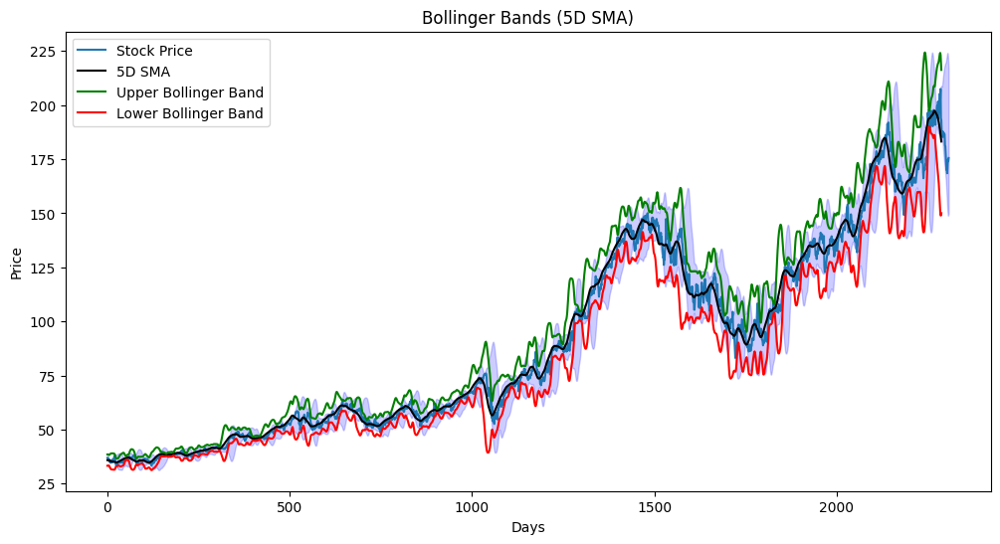

In [17]:
# Feature selection and normalization
features_5d = ['Open', 'High', 'Low', 'Close', '5d_sma']
train_loader_5d, test_loader_5d, X_train_5d, X_test_5d, y_train_5d, y_test_5d, scaler_5d = feature_selection(df, features_5d)

# Calculate and Visualize Bollinger Bands 5d price
calculate_bollinger_bands(df, '5d_sma', '5D SMA')

### 7D SMA

torch.Size([1810, 45, 5]) torch.Size([453, 45, 5])
torch.Size([1810]) torch.Size([453])


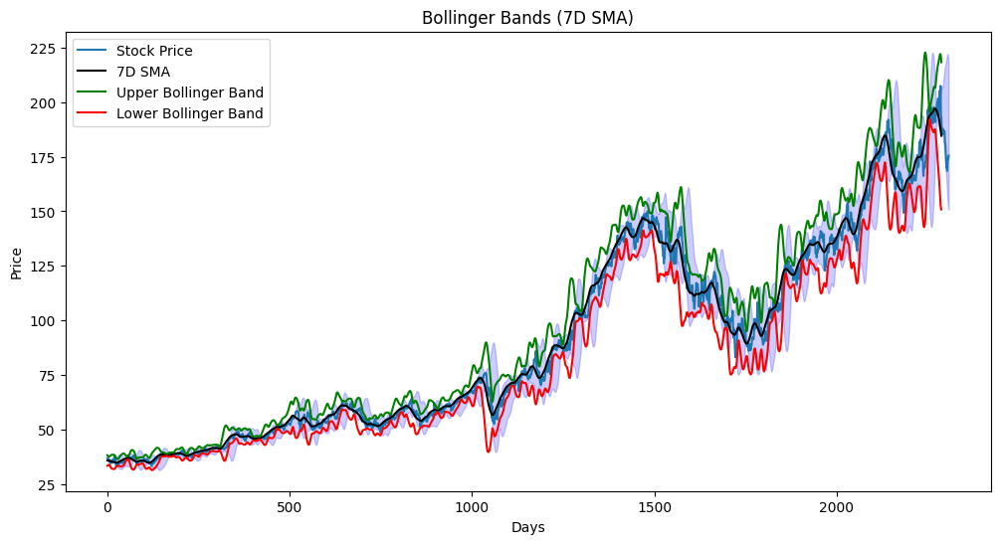

In [18]:
# Feature selection and normalization
features_7d = ['Open', 'High', 'Low', 'Close', '7d_sma']
train_loader_7d, test_loader_7d, X_train_7d, X_test_7d, y_train_7d, y_test_7d, scaler_7d = feature_selection(df, features_7d)

# Calculate and Visualize Bollinger Bands 7d price
calculate_bollinger_bands(df, '7d_sma', '7D SMA')

### 9D SMA

torch.Size([1810, 45, 5]) torch.Size([453, 45, 5])
torch.Size([1810]) torch.Size([453])


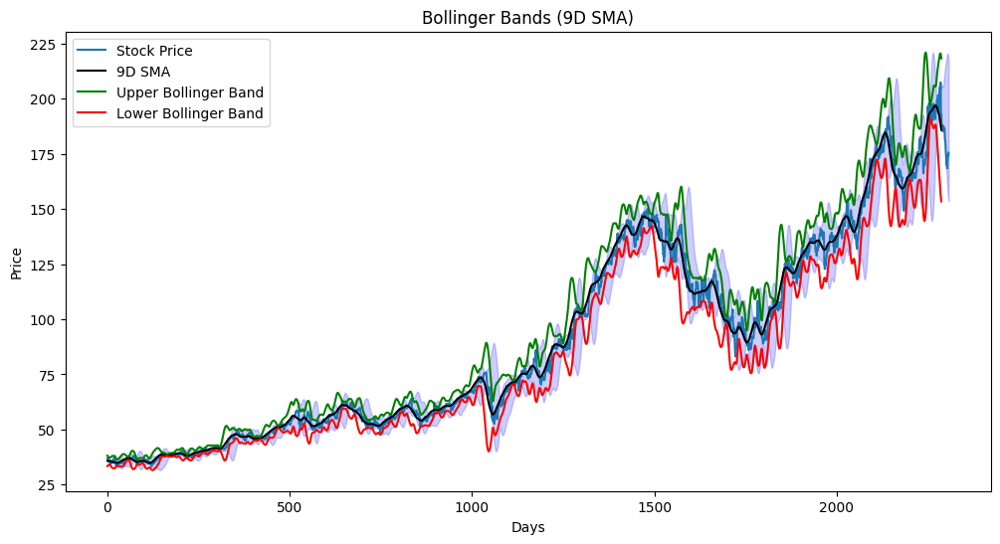

In [19]:
# Feature selection and normalization
features_9d = ['Open', 'High', 'Low', 'Close', '9d_sma']
train_loader_9d, test_loader_9d, X_train_9d, X_test_9d, y_train_9d, y_test_9d, scaler_9d = feature_selection(df, features_9d)

# Calculate and Visualize Bollinger Bands 9d price
calculate_bollinger_bands(df, '9d_sma', '9D SMA')

### 11D SMA

torch.Size([1810, 45, 5]) torch.Size([453, 45, 5])
torch.Size([1810]) torch.Size([453])


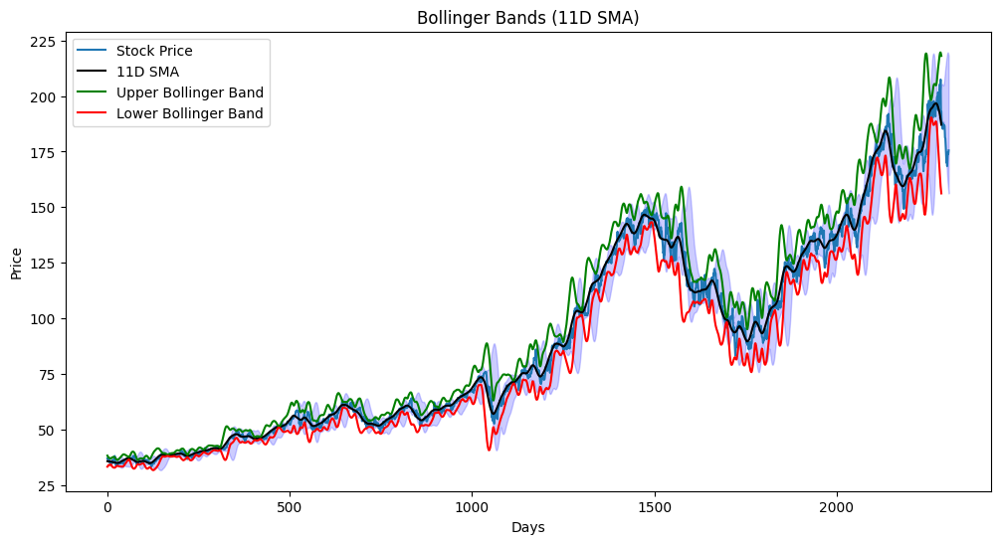

In [20]:
# Feature selection and normalization
features_11d = ['Open', 'High', 'Low', 'Close', '11d_sma']
train_loader_11d, test_loader_11d, X_train_11d, X_test_11d, y_train_11d, y_test_11d, scaler_11d = feature_selection(df, features_11d)

# Calculate and Visualize Bollinger Bands 11d price
calculate_bollinger_bands(df, '11d_sma', '11D SMA')

### 13D SMA

torch.Size([1810, 45, 5]) torch.Size([453, 45, 5])
torch.Size([1810]) torch.Size([453])


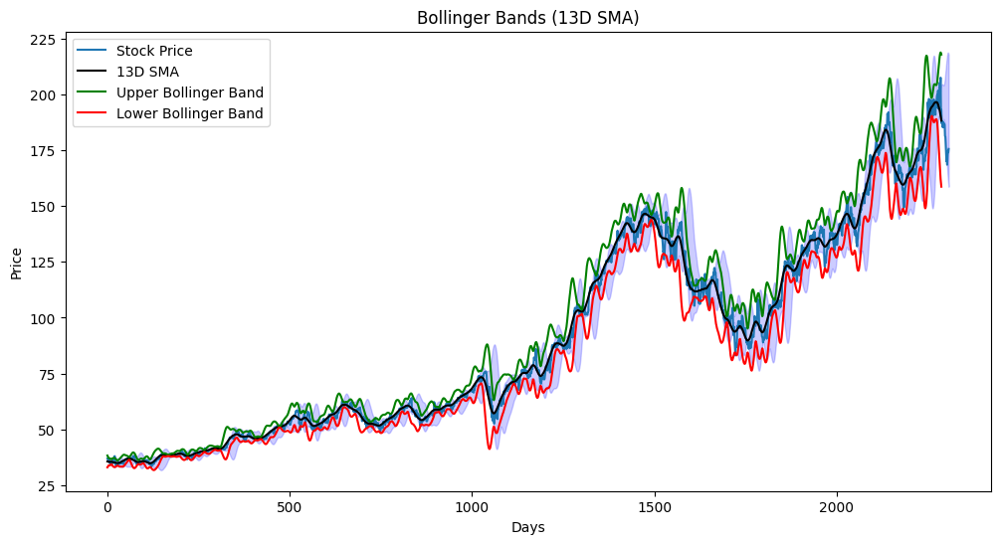

In [21]:
# Feature selection and normalization
features_13d = ['Open', 'High', 'Low', 'Close', '13d_sma']
train_loader_13d, test_loader_13d, X_train_13d, X_test_13d, y_train_13d, y_test_13d, scaler_13d = feature_selection(df, features_13d)

# Calculate and Visualize Bollinger Bands 13d price
calculate_bollinger_bands(df, '13d_sma', '13D SMA')

### 15D SMA

torch.Size([1810, 45, 5]) torch.Size([453, 45, 5])
torch.Size([1810]) torch.Size([453])


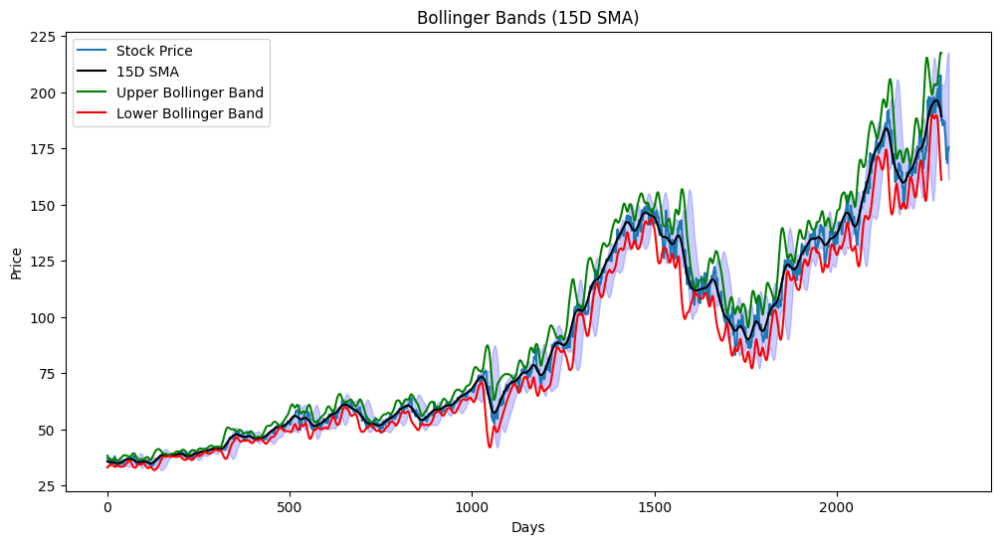

In [22]:
# Feature selection and normalization
features_15d = ['Open', 'High', 'Low', 'Close', '15d_sma']
train_loader_15d, test_loader_15d, X_train_15d, X_test_15d, y_train_15d, y_test_15d, scaler_15d = feature_selection(df, features_15d)

# Calculate and Visualize Bollinger Bands 15d price
calculate_bollinger_bands(df, '15d_sma', '15D SMA')

### 17D SMA

torch.Size([1810, 45, 5]) torch.Size([453, 45, 5])
torch.Size([1810]) torch.Size([453])


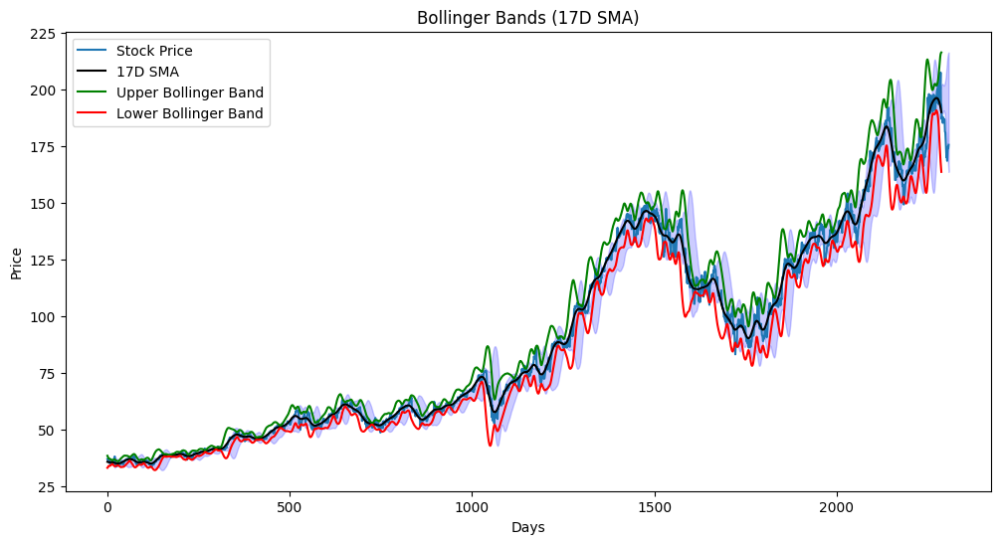

In [23]:
# Feature selection and normalization
features_17d = ['Open', 'High', 'Low', 'Close', '17d_sma']
train_loader_17d, test_loader_17d, X_train_17d, X_test_17d, y_train_17d, y_test_17d, scaler_17d = feature_selection(df, features_17d)

# Calculate and Visualize Bollinger Bands 17d price
calculate_bollinger_bands(df, '17d_sma', '17D SMA')

### 5-17D SMA

In [24]:
# Feature selection and normalization
features_all = ['Open', 'High', 'Low', 'Close', '5d_sma', '7d_sma', '9d_sma', '11d_sma', '13d_sma', '15d_sma', '17d_sma']
train_loader_all, test_loader_all, X_train_all, X_test_all, y_train_all, y_test_all, scaler_all = feature_selection(df, features_all)

torch.Size([1810, 45, 11]) torch.Size([453, 45, 11])
torch.Size([1810]) torch.Size([453])


In [25]:
df = df.sort_values('Date').set_index('Date')

# Model Architecture

The LSTM model is defined as:

- **First LSTM Layer**: LSTM_UNIT units, returns sequences.
- **Dropout**: DROPOUT_RATE.
- **Second LSTM Layer**: LSTM_UNIT/2 units, no sequences returned.
- **Dropout**: DROPOUT_RATE.

This structure captures temporal patterns while reducing overfitting.

The LSTM model is defined as:

```python
StockLSTM(
  (lstm): LSTM(
    input_size={input_size}, 
    hidden_size=LSTM_UNIT, 
    num_layers=1, 
    dropout=DROPOUT_RATE, 
    batch_first=True
  )
  (dropout): Dropout(p=DROPOUT_RATE)
  (dense): Linear(in_features=LSTM_UNIT, out_features=1, bias=True)
)

In [26]:
class StockLSTM(nn.Module):
    def __init__(self, input_size, lstm_units=LSTM_UNIT, num_layers=1, dropout=0.2, l2_reg=L2_REGULARIZER):
        super().__init__()
        self.lstm = nn.LSTM(
            input_size=input_size,
            hidden_size=lstm_units,
            num_layers=num_layers,
            batch_first=True,
            dropout=dropout
        )
        self.dropout = nn.Dropout(dropout)
        self.dense = nn.Linear(lstm_units, 1)

        # L2 regularization
        self.l2_reg = l2_reg
        self.dense.weight_decay = l2_reg

    def forward(self, x):
        # LSTM returns 
        out, _ = self.lstm(x)  # Shape: (batch, seq_len, lstm_units)
        out = out[:, -1, :]
        out = self.dropout(out)
        out = self.dense(out)
        return out

In [27]:
model_simple = StockLSTM(input_size=len(features_simple), dropout=DROPOUT_RATE).to(device)

/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning:

dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.3 and num_layers=1



In [28]:
model_5d = StockLSTM(input_size=len(features_5d), dropout=DROPOUT_RATE).to(device)

In [29]:
model_7d = StockLSTM(input_size=len(features_7d), dropout=DROPOUT_RATE).to(device)

In [30]:
model_9d = StockLSTM(input_size=len(features_9d), dropout=DROPOUT_RATE).to(device)

In [31]:
model_11d = StockLSTM(input_size=len(features_11d), dropout=DROPOUT_RATE).to(device)

In [32]:
model_13d = StockLSTM(input_size=len(features_13d), dropout=DROPOUT_RATE).to(device)

In [33]:
model_15d = StockLSTM(input_size=len(features_15d), dropout=DROPOUT_RATE).to(device)

In [34]:
model_17d = StockLSTM(input_size=len(features_17d), dropout=DROPOUT_RATE).to(device)

In [35]:
model_all = StockLSTM(input_size=len(features_all), dropout=DROPOUT_RATE).to(device)

# Training the Models

Models are trained for each configuration:

- **Compilation**: Adam optimizer, MSE loss.
- **Training**:
  - Batch size: 128.
  - Epochs: 700.
  - Validation: 20% of data.
- **Configurations**:
  - Simple data.
  - Individual SMAs (5D to 17D).
  - All SMAs combined.
- **Visualization**: Plots training/validation loss.

This produces trained models for evaluation.

In [36]:
# Plot training loss
def plot_model_data(train_losses, val_losses, model_name):
    plt.figure(figsize=(12, 6))
    plt.plot(train_losses, label='Train Loss')
    plt.plot(val_losses, label='Validation Loss')
    plt.title(f'Model Loss - {model_name}')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()

In [37]:
def train_model(model, train_loader, test_loader, model_name):
    criterion = nn.MSELoss()
    optimizer = optim.Adam(model.parameters(), lr=LEARNING_RATE, weight_decay=model.l2_reg)
    
    # Add learning rate scheduler
    scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', patience=PATIENCE, factor=0.5)
    
    # Initialize lists and early stopping variables
    train_losses, val_losses = [], []
    best_val_loss = float('inf')  
    patience_counter = 0      
    early_stop_patience = PATIENCE
    
    # Training loop
    for epoch in range(EPOCH):
        # Training phase
        model.train()
        train_loss = 0
        for X_batch, y_batch in train_loader:
            X_batch, y_batch = X_batch.to(device), y_batch.to(device)
            optimizer.zero_grad()
            y_pred = model(X_batch)

            # Manually add L2 regularization for LSTM weights
            l2_lambda = model.l2_reg
            l2_reg = torch.tensor(0., requires_grad=True)
            loss = criterion(y_pred.squeeze(), y_batch)
            loss = loss + l2_lambda * l2_reg  # Add regularization to loss
            loss.backward()
            
            optimizer.step()
            train_loss += loss.item()
        
        train_loss /= len(train_loader)
        train_losses.append(train_loss)
        
        # Validation phase
        model.eval()
        val_loss = 0
        with torch.no_grad():
            for X_batch, y_batch in test_loader:
                X_batch, y_batch = X_batch.to(device), y_batch.to(device)
                y_pred = model(X_batch)
                val_loss += criterion(y_pred.squeeze(), y_batch).item()
        val_loss /= len(test_loader)
        val_losses.append(val_loss)
        
        scheduler.step(val_loss)
        
        # Early stopping logic
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            patience_counter = 0
            torch.save(model.state_dict(), f'best_{model_name}.pth')
        else:
            patience_counter += 1
            if patience_counter >= early_stop_patience:
                print("Early stopping triggered")
                break
                
        # Print progress every 50 epochs
        if (epoch + 1) % 50 == 0:
            print(f'Epoch {epoch+1}, {model_name} Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}')
    
    return train_losses, val_losses

Epoch 50, Without SMA Train Loss: 0.0009, Val Loss: 0.0019
Epoch 100, Without SMA Train Loss: 0.0006, Val Loss: 0.0013
Epoch 150, Without SMA Train Loss: 0.0004, Val Loss: 0.0012
Epoch 200, Without SMA Train Loss: 0.0004, Val Loss: 0.0007
Epoch 250, Without SMA Train Loss: 0.0003, Val Loss: 0.0006
Epoch 300, Without SMA Train Loss: 0.0004, Val Loss: 0.0005
Epoch 350, Without SMA Train Loss: 0.0003, Val Loss: 0.0004
Epoch 400, Without SMA Train Loss: 0.0003, Val Loss: 0.0009
Epoch 450, Without SMA Train Loss: 0.0004, Val Loss: 0.0004
Early stopping triggered


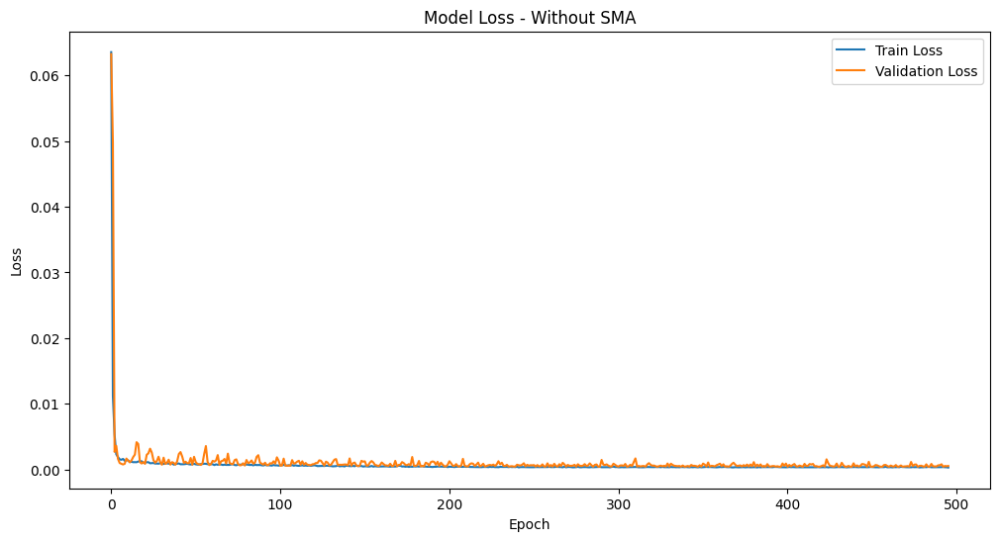

In [38]:
train_loss_simple, val_loss_simple = train_model(model_simple, train_loader_simple, test_loader_simple, 'Without SMA')
plot_model_data(train_loss_simple, val_loss_simple, 'Without SMA')

Epoch 50, 5D SMA Train Loss: 0.0010, Val Loss: 0.0015
Epoch 100, 5D SMA Train Loss: 0.0007, Val Loss: 0.0009
Epoch 150, 5D SMA Train Loss: 0.0006, Val Loss: 0.0016
Epoch 200, 5D SMA Train Loss: 0.0004, Val Loss: 0.0011
Epoch 250, 5D SMA Train Loss: 0.0004, Val Loss: 0.0005
Epoch 300, 5D SMA Train Loss: 0.0004, Val Loss: 0.0010
Epoch 350, 5D SMA Train Loss: 0.0003, Val Loss: 0.0007
Epoch 400, 5D SMA Train Loss: 0.0003, Val Loss: 0.0007
Epoch 450, 5D SMA Train Loss: 0.0004, Val Loss: 0.0013
Epoch 500, 5D SMA Train Loss: 0.0004, Val Loss: 0.0007
Epoch 550, 5D SMA Train Loss: 0.0003, Val Loss: 0.0005
Epoch 600, 5D SMA Train Loss: 0.0005, Val Loss: 0.0005
Early stopping triggered


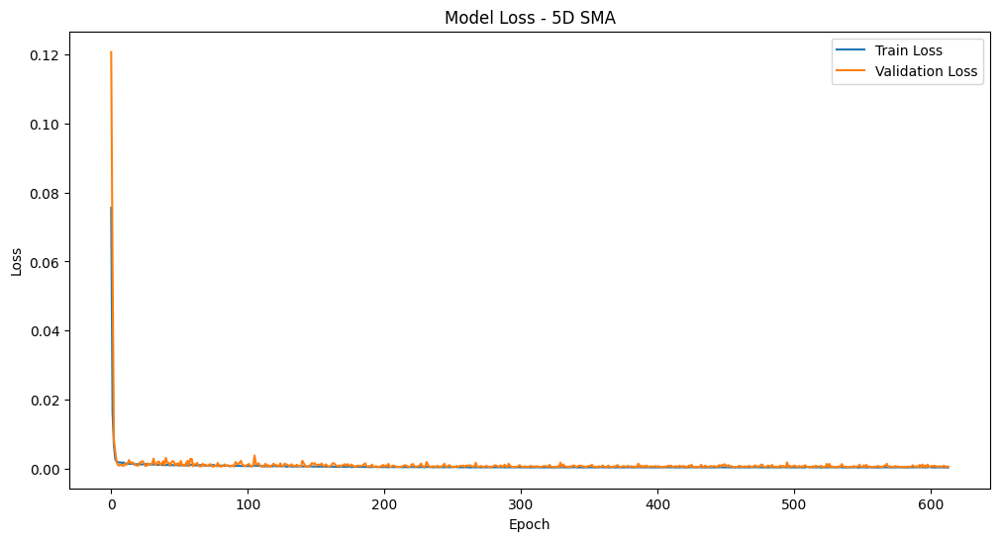

In [39]:
train_loss_5d, val_loss_5d = train_model(model_5d, train_loader_5d, test_loader_5d, '5D SMA')
plot_model_data(train_loss_5d, val_loss_5d, '5D SMA')

Epoch 50, 7D SMA Train Loss: 0.0009, Val Loss: 0.0009
Epoch 100, 7D SMA Train Loss: 0.0006, Val Loss: 0.0006
Epoch 150, 7D SMA Train Loss: 0.0004, Val Loss: 0.0006
Epoch 200, 7D SMA Train Loss: 0.0004, Val Loss: 0.0010
Epoch 250, 7D SMA Train Loss: 0.0004, Val Loss: 0.0006
Epoch 300, 7D SMA Train Loss: 0.0003, Val Loss: 0.0010
Epoch 350, 7D SMA Train Loss: 0.0004, Val Loss: 0.0005
Epoch 400, 7D SMA Train Loss: 0.0004, Val Loss: 0.0005
Early stopping triggered


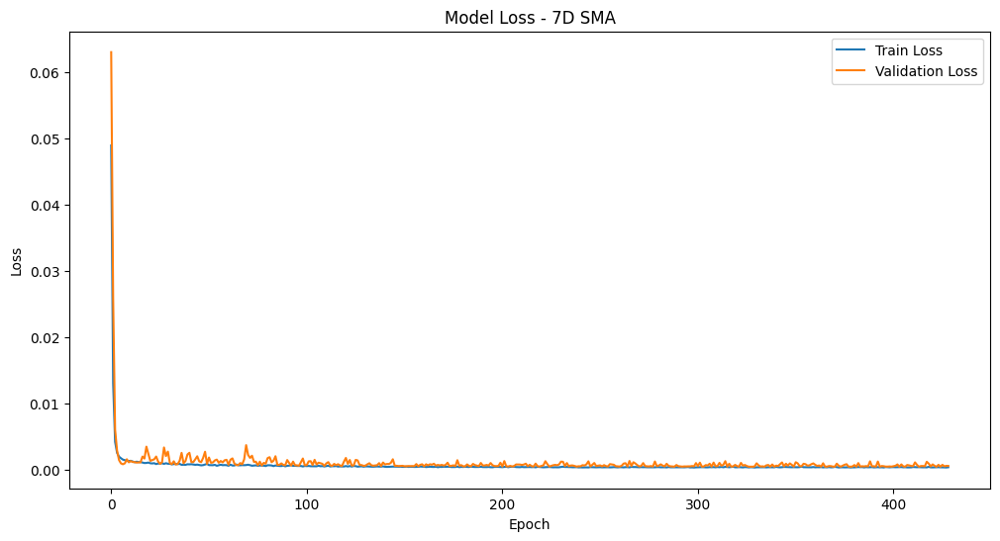

In [40]:
train_loss_7d, val_loss_7d = train_model(model_7d, train_loader_7d, test_loader_7d, '7D SMA')
plot_model_data(train_loss_7d, val_loss_7d, '7D SMA')

Epoch 50, 9D SMA Train Loss: 0.0009, Val Loss: 0.0010
Epoch 100, 9D SMA Train Loss: 0.0007, Val Loss: 0.0007
Epoch 150, 9D SMA Train Loss: 0.0005, Val Loss: 0.0013
Epoch 200, 9D SMA Train Loss: 0.0004, Val Loss: 0.0006
Epoch 250, 9D SMA Train Loss: 0.0004, Val Loss: 0.0005
Epoch 300, 9D SMA Train Loss: 0.0004, Val Loss: 0.0005
Epoch 350, 9D SMA Train Loss: 0.0004, Val Loss: 0.0006
Epoch 400, 9D SMA Train Loss: 0.0004, Val Loss: 0.0005
Epoch 450, 9D SMA Train Loss: 0.0003, Val Loss: 0.0005
Epoch 500, 9D SMA Train Loss: 0.0004, Val Loss: 0.0011
Epoch 550, 9D SMA Train Loss: 0.0004, Val Loss: 0.0007
Early stopping triggered


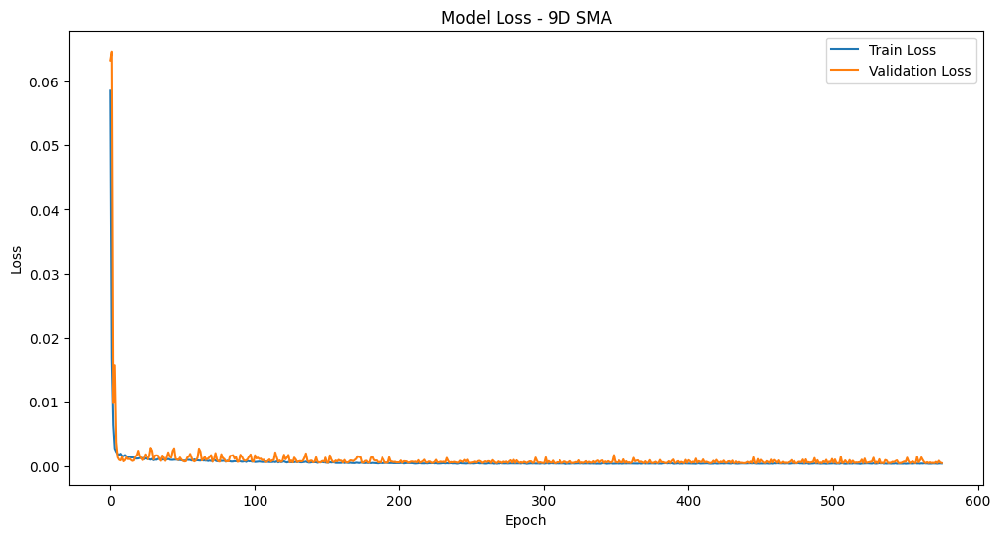

In [41]:
train_loss_9d, val_loss_9d = train_model(model_9d, train_loader_9d, test_loader_9d, '9D SMA')
plot_model_data(train_loss_9d, val_loss_9d, '9D SMA')

Epoch 50, 11D SMA Train Loss: 0.0010, Val Loss: 0.0012
Epoch 100, 11D SMA Train Loss: 0.0008, Val Loss: 0.0007
Epoch 150, 11D SMA Train Loss: 0.0006, Val Loss: 0.0005
Epoch 200, 11D SMA Train Loss: 0.0004, Val Loss: 0.0009
Epoch 250, 11D SMA Train Loss: 0.0004, Val Loss: 0.0005
Epoch 300, 11D SMA Train Loss: 0.0005, Val Loss: 0.0005
Epoch 350, 11D SMA Train Loss: 0.0004, Val Loss: 0.0005
Epoch 400, 11D SMA Train Loss: 0.0003, Val Loss: 0.0006
Epoch 450, 11D SMA Train Loss: 0.0004, Val Loss: 0.0006
Epoch 500, 11D SMA Train Loss: 0.0004, Val Loss: 0.0006
Epoch 550, 11D SMA Train Loss: 0.0004, Val Loss: 0.0004
Epoch 600, 11D SMA Train Loss: 0.0003, Val Loss: 0.0010
Early stopping triggered


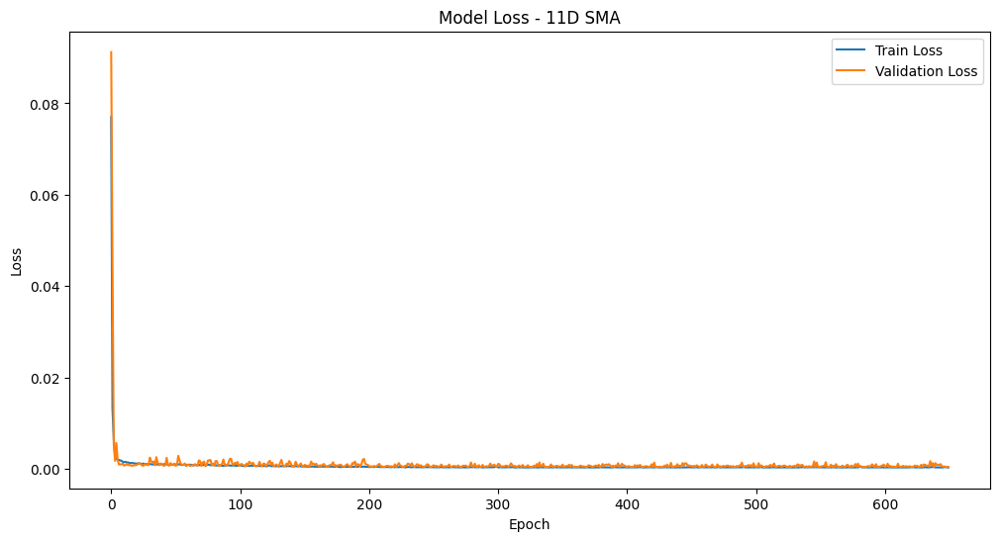

In [42]:
train_loss_11d, val_loss_11d = train_model(model_11d, train_loader_11d, test_loader_11d, '11D SMA')
plot_model_data(train_loss_11d, val_loss_11d, '11D SMA')

Epoch 50, 13D SMA Train Loss: 0.0009, Val Loss: 0.0009
Epoch 100, 13D SMA Train Loss: 0.0006, Val Loss: 0.0006
Epoch 150, 13D SMA Train Loss: 0.0005, Val Loss: 0.0006
Epoch 200, 13D SMA Train Loss: 0.0004, Val Loss: 0.0006
Epoch 250, 13D SMA Train Loss: 0.0004, Val Loss: 0.0006
Epoch 300, 13D SMA Train Loss: 0.0004, Val Loss: 0.0013
Epoch 350, 13D SMA Train Loss: 0.0004, Val Loss: 0.0005
Epoch 400, 13D SMA Train Loss: 0.0004, Val Loss: 0.0005
Epoch 450, 13D SMA Train Loss: 0.0003, Val Loss: 0.0005
Epoch 500, 13D SMA Train Loss: 0.0004, Val Loss: 0.0009
Early stopping triggered


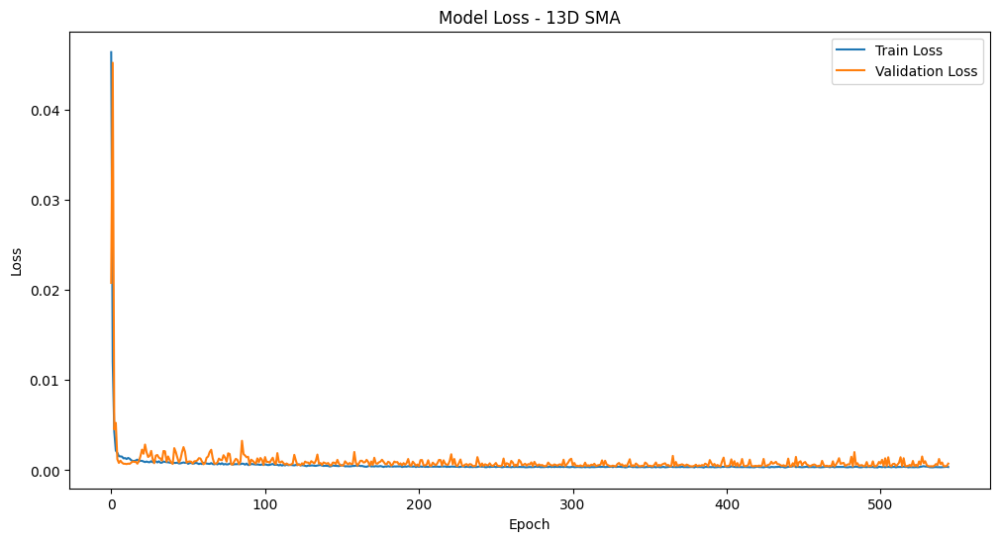

In [43]:
train_loss_13d, val_loss_13d = train_model(model_13d, train_loader_13d, test_loader_13d, '13D SMA')
plot_model_data(train_loss_13d, val_loss_13d, '13D SMA')

Epoch 50, 15D SMA Train Loss: 0.0008, Val Loss: 0.0016
Epoch 100, 15D SMA Train Loss: 0.0006, Val Loss: 0.0010
Epoch 150, 15D SMA Train Loss: 0.0005, Val Loss: 0.0007
Epoch 200, 15D SMA Train Loss: 0.0004, Val Loss: 0.0007
Epoch 250, 15D SMA Train Loss: 0.0004, Val Loss: 0.0009
Epoch 300, 15D SMA Train Loss: 0.0004, Val Loss: 0.0008
Epoch 350, 15D SMA Train Loss: 0.0003, Val Loss: 0.0010
Epoch 400, 15D SMA Train Loss: 0.0004, Val Loss: 0.0006
Epoch 450, 15D SMA Train Loss: 0.0003, Val Loss: 0.0006
Epoch 500, 15D SMA Train Loss: 0.0004, Val Loss: 0.0010
Epoch 550, 15D SMA Train Loss: 0.0004, Val Loss: 0.0009
Epoch 600, 15D SMA Train Loss: 0.0004, Val Loss: 0.0006
Epoch 650, 15D SMA Train Loss: 0.0003, Val Loss: 0.0005
Early stopping triggered


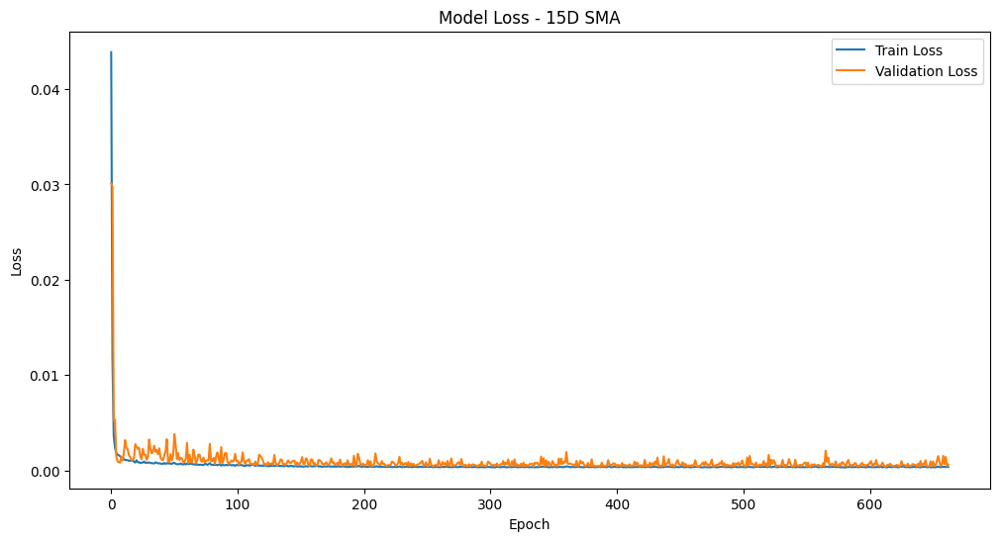

In [44]:
train_loss_15d, val_loss_15d = train_model(model_15d, train_loader_15d, test_loader_15d, '15D SMA')
plot_model_data(train_loss_15d, val_loss_15d, '15D SMA')

Epoch 50, 17D SMA Train Loss: 0.0007, Val Loss: 0.0011
Epoch 100, 17D SMA Train Loss: 0.0005, Val Loss: 0.0013
Epoch 150, 17D SMA Train Loss: 0.0005, Val Loss: 0.0008
Epoch 200, 17D SMA Train Loss: 0.0004, Val Loss: 0.0010
Epoch 250, 17D SMA Train Loss: 0.0004, Val Loss: 0.0009
Epoch 300, 17D SMA Train Loss: 0.0004, Val Loss: 0.0006
Epoch 350, 17D SMA Train Loss: 0.0003, Val Loss: 0.0012
Epoch 400, 17D SMA Train Loss: 0.0004, Val Loss: 0.0004
Epoch 450, 17D SMA Train Loss: 0.0004, Val Loss: 0.0004
Epoch 500, 17D SMA Train Loss: 0.0004, Val Loss: 0.0007
Epoch 550, 17D SMA Train Loss: 0.0004, Val Loss: 0.0004
Early stopping triggered


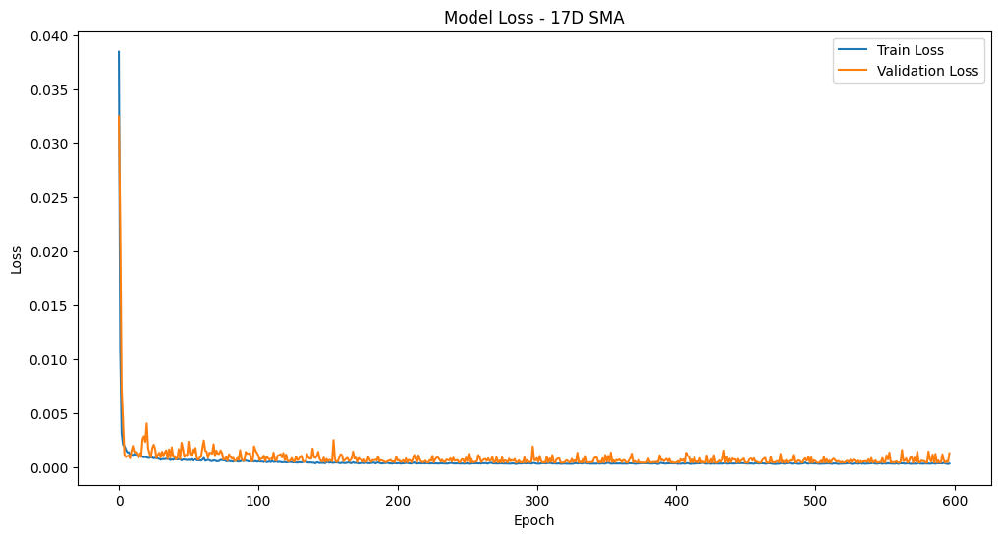

In [45]:
train_loss_17d, val_loss_17d = train_model(model_17d, train_loader_17d, test_loader_17d, '17D SMA')
plot_model_data(train_loss_17d, val_loss_17d, '17D SMA')

Epoch 50, All SMAs Train Loss: 0.0006, Val Loss: 0.0009
Epoch 100, All SMAs Train Loss: 0.0004, Val Loss: 0.0006
Epoch 150, All SMAs Train Loss: 0.0004, Val Loss: 0.0005
Epoch 200, All SMAs Train Loss: 0.0003, Val Loss: 0.0010
Epoch 250, All SMAs Train Loss: 0.0004, Val Loss: 0.0005
Epoch 300, All SMAs Train Loss: 0.0003, Val Loss: 0.0009
Epoch 350, All SMAs Train Loss: 0.0004, Val Loss: 0.0009
Epoch 400, All SMAs Train Loss: 0.0004, Val Loss: 0.0008
Epoch 450, All SMAs Train Loss: 0.0004, Val Loss: 0.0015
Epoch 500, All SMAs Train Loss: 0.0004, Val Loss: 0.0006
Early stopping triggered


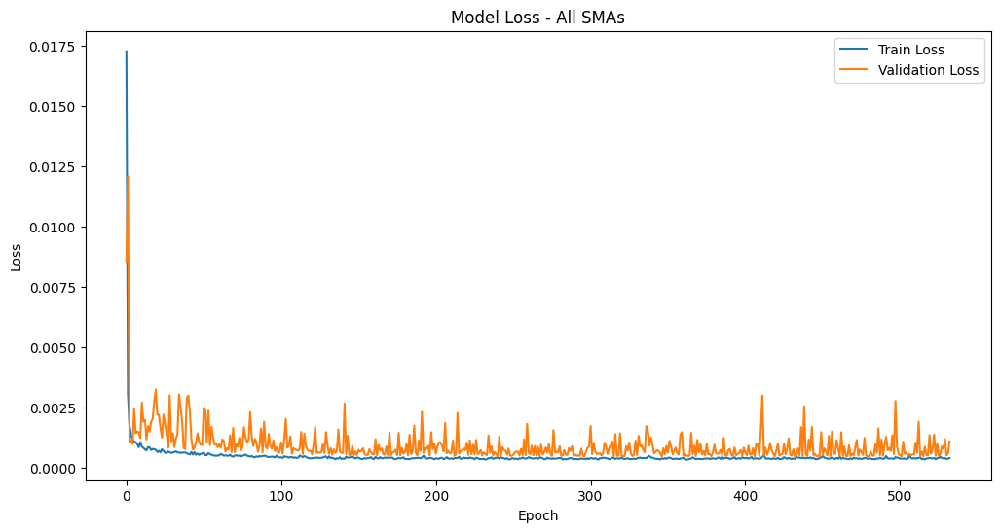

In [46]:
train_loss_all, val_loss_all = train_model(model_all, train_loader_all, test_loader_all, 'All SMAs')
plot_model_data(train_loss_all, val_loss_all, 'All SMAs')

# Model Evaluation

## Process

Models are evaluated on the test set:

- **Prediction**: Scaled predictions are inverse-transformed.
- **Metrics**:
  - MAE (Mean Absolute Error).
  - MSE (Mean Squared Error).
  - RMSE (Root Mean Squared Error).
  - R² (Goodness of fit).
  - MAPE (Mean Absolute Percentage Error).
  - Directional Accuracy (% correct direction).
- **Visualization**: True vs. predicted prices.

In [47]:
the_best_models_list = []

In [48]:
# Create inverse transformation helper
def inverse_transform_prediction(scaler, scaled_prediction, features):
    temp = np.zeros((len(scaled_prediction), len(features)))
    temp[:, features.index(target_col)] = scaled_prediction
    return scaler.inverse_transform(temp)[:, features.index(target_col)]

In [49]:
def evaluate_model(model, features, scaler, X_test, y_test, model_name, model_id=None):
    model.eval()
    with torch.no_grad():
        X_test = X_test.to(device)
        y_pred = model(X_test).squeeze().cpu().numpy()
        y_test_true = y_test.numpy()
    
    # Inverse transform
    temp = np.zeros((len(y_pred), len(features)))
    temp[:, features.index(target_col)] = y_pred
    y_pred_inv = scaler.inverse_transform(temp)[:, features.index(target_col)]
    temp[:, features.index(target_col)] = y_test_true
    y_test_inv = scaler.inverse_transform(temp)[:, features.index(target_col)]
    
    # Metrics
    mae = mean_absolute_error(y_test_inv, y_pred_inv)
    mse = mean_squared_error(y_test_inv, y_pred_inv)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_test_inv, y_pred_inv)
    mape = mean_absolute_percentage_error(y_test_inv, y_pred_inv)
    direction_true = np.diff(y_test_inv) > 0
    direction_pred = np.diff(y_pred_inv) > 0
    directional_acc = np.mean(direction_true == direction_pred)
    
    print(f"{model_name} MAE: {mae:.2f}")
    print(f"{model_name} MSE: {mse:.2f}")
    print(f"{model_name} RMSE: {rmse:.2f}")
    print(f"{model_name} R² Score: {r2:.4f}")
    print(f"{model_name} Directional Accuracy: {directional_acc*100:.2f}%")
    print(f"{model_name} MAPE: {mape*100:.2f}%")

    if mape*100 < 2.5 and 'd_' in model_id:
        the_best_models_list.append(model_id)
    
    plt.figure(figsize=(12, 6))
    plt.plot(y_test_inv, label='True Price')
    plt.plot(y_pred_inv, label='Predicted Price')
    plt.title(f'Test Set Predictions vs Actuals - {model_name}')
    plt.xlabel('Time Steps')
    plt.ylabel('Price (USD)')
    plt.legend()
    plt.show()

## Models

- Simple data.
- Individual SMAs (5D to 17D).
- All SMAs.

This assesses predictive accuracy comprehensively.

Without SMA MAE: 2.94
Without SMA MSE: 14.49
Without SMA RMSE: 3.81
Without SMA R² Score: 0.9729
Without SMA Directional Accuracy: 46.68%
Without SMA MAPE: 1.85%


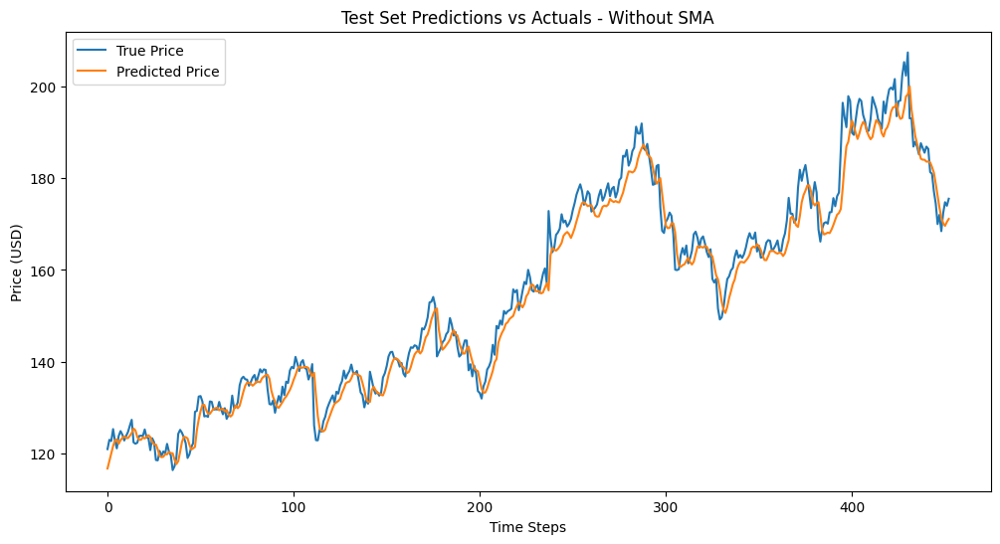

In [50]:
evaluate_model(model_simple, features_simple, scaler_simple, X_test_simple, y_test_simple, 'Without SMA', 'no_sma')

5D MAE: 2.92
5D MSE: 14.48
5D RMSE: 3.80
5D R² Score: 0.9730
5D Directional Accuracy: 46.24%
5D MAPE: 1.85%


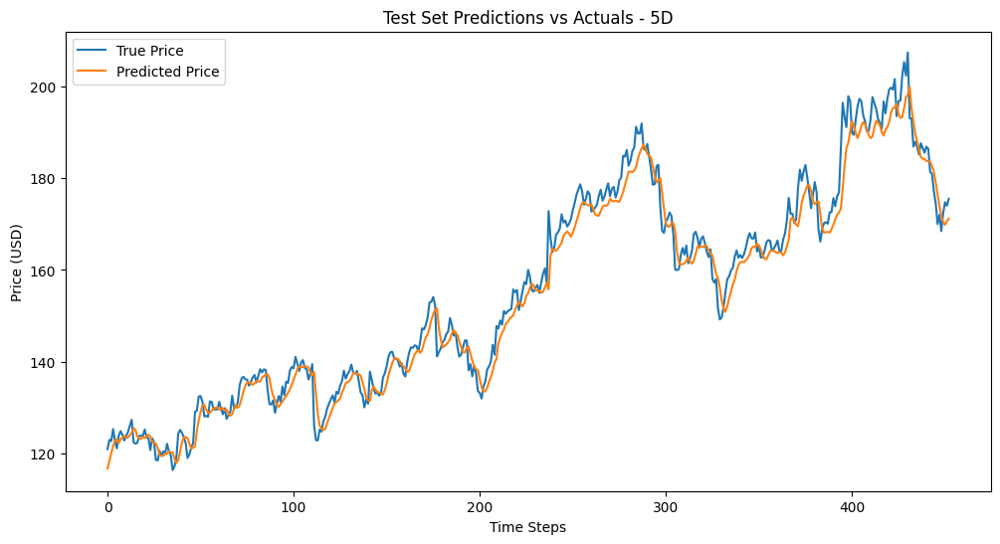

In [51]:
evaluate_model(model_5d, features_5d, scaler_5d, X_test_5d, y_test_5d, '5D', '5d_sma')

7D MAE: 3.00
7D MSE: 15.10
7D RMSE: 3.89
7D R² Score: 0.9718
7D Directional Accuracy: 46.46%
7D MAPE: 1.89%


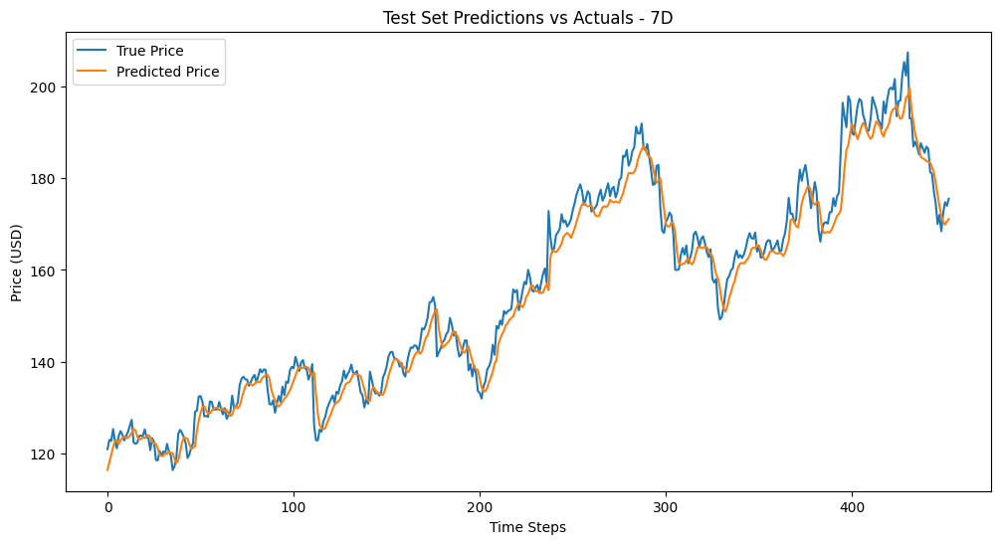

In [52]:
evaluate_model(model_7d, features_7d, scaler_7d, X_test_7d, y_test_7d, '7D', '7d_sma')

9D MAE: 2.55
9D MSE: 12.44
9D RMSE: 3.53
9D R² Score: 0.9768
9D Directional Accuracy: 46.02%
9D MAPE: 1.65%


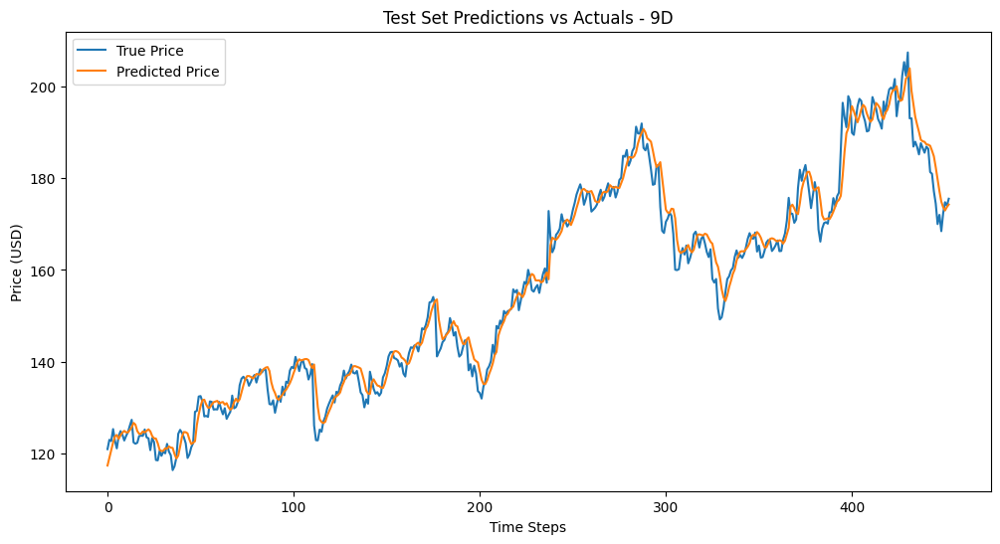

In [53]:
evaluate_model(model_9d, features_9d, scaler_9d, X_test_9d, y_test_9d, '9D', '9d_sma')

11D MAE: 2.54
11D MSE: 12.36
11D RMSE: 3.52
11D R² Score: 0.9769
11D Directional Accuracy: 46.90%
11D MAPE: 1.64%


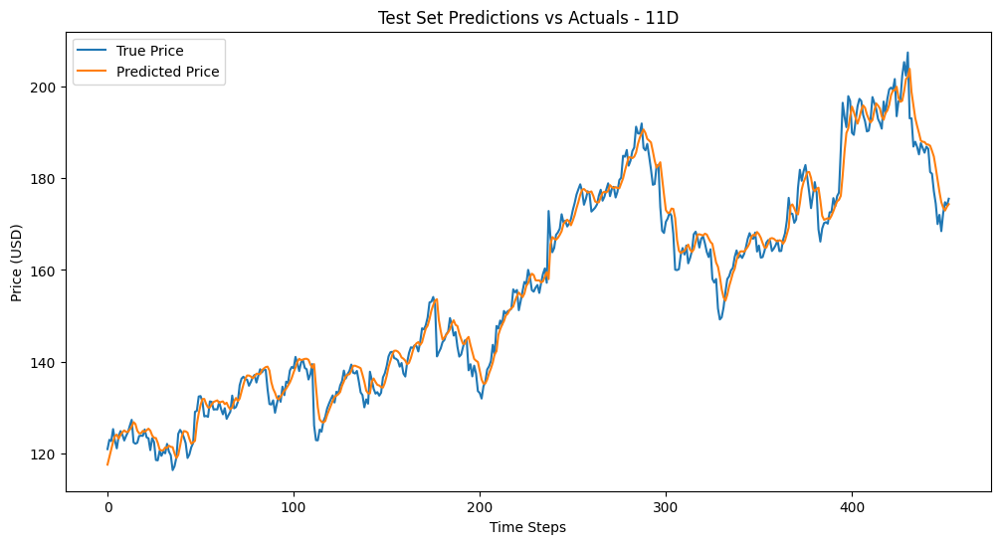

In [54]:
evaluate_model(model_11d, features_11d, scaler_11d, X_test_11d, y_test_11d, '11D', '11d_sma')

13D MAE: 3.54
13D MSE: 19.78
13D RMSE: 4.45
13D R² Score: 0.9631
13D Directional Accuracy: 47.12%
13D MAPE: 2.22%


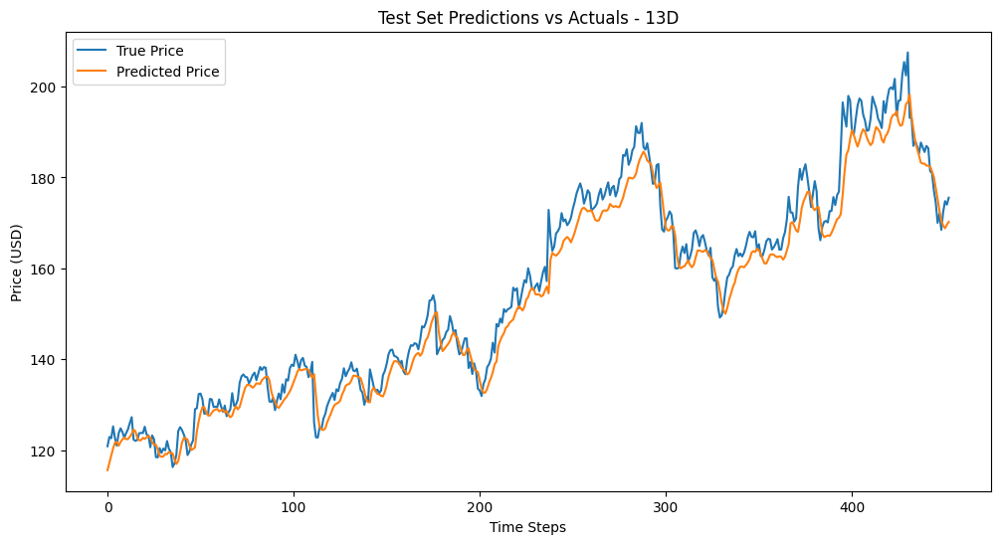

In [55]:
evaluate_model(model_13d, features_13d, scaler_13d, X_test_13d, y_test_13d, '13D', '13d_sma')

15D MAE: 3.18
15D MSE: 16.73
15D RMSE: 4.09
15D R² Score: 0.9688
15D Directional Accuracy: 47.35%
15D MAPE: 1.99%


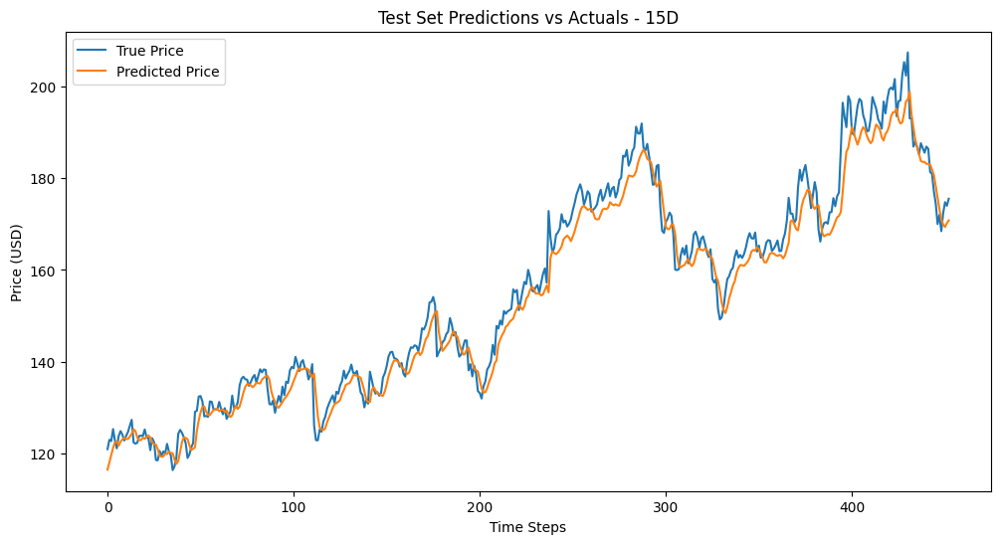

In [56]:
evaluate_model(model_15d, features_15d, scaler_15d, X_test_15d, y_test_15d, '15D', '15d_sma')

17D MAE: 5.10
17D MSE: 35.72
17D RMSE: 5.98
17D R² Score: 0.9333
17D Directional Accuracy: 47.12%
17D MAPE: 3.20%


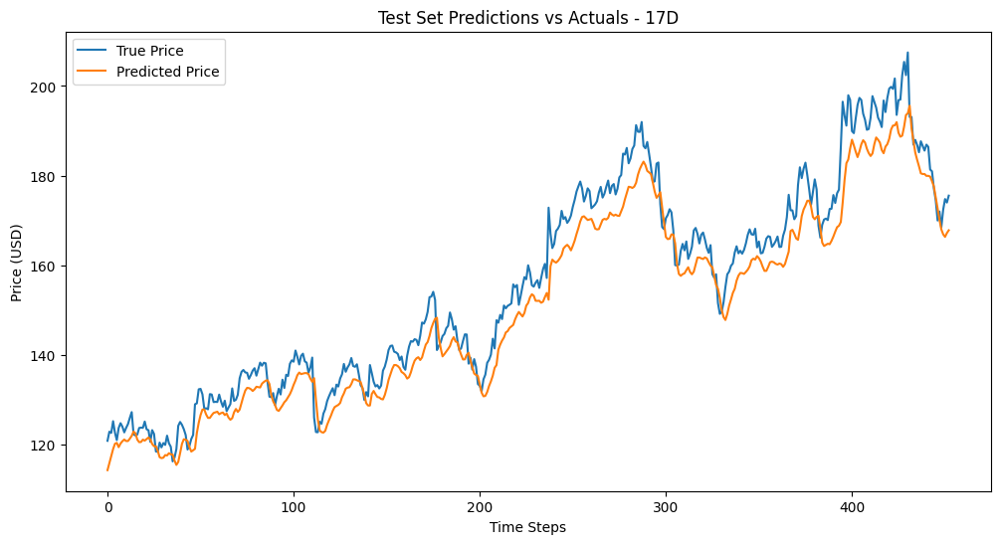

In [57]:
evaluate_model(model_17d, features_17d, scaler_17d, X_test_17d, y_test_17d, '17D', '17d_sma')

ALL MAE: 4.50
ALL MSE: 29.36
ALL RMSE: 5.42
ALL R² Score: 0.9452
ALL Directional Accuracy: 46.90%
ALL MAPE: 2.83%


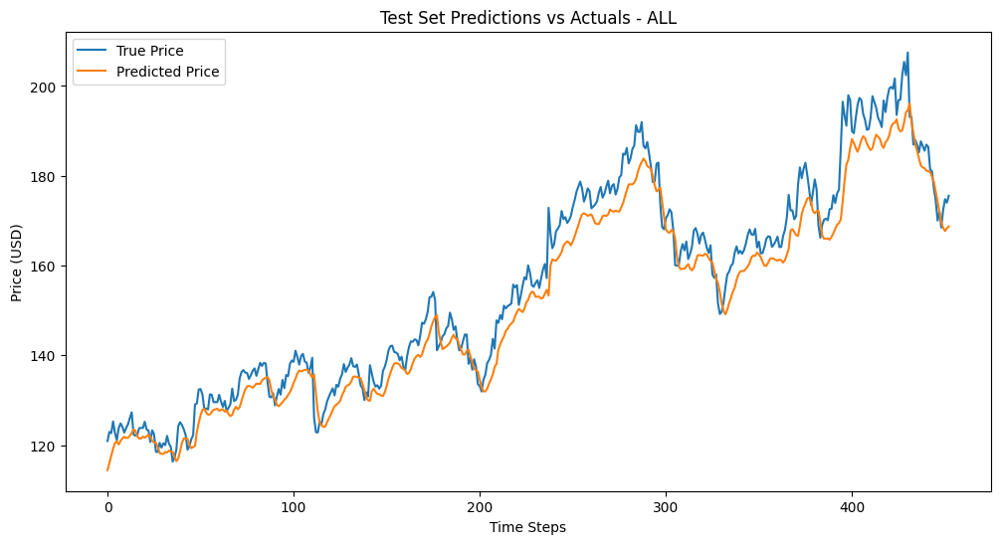

In [58]:
evaluate_model(model_all, features_all, scaler_all, X_test_all, y_test_all, 'ALL', 'all_sma')

# Future Prediction

## Process

The `predict_future_days` function forecasts 10 days:

- **Method**: Iteratively predicts using the last test sequence.
- **Output**: Inverse-transformed predictions with dates.
- **Evaluation**: Compares to actual data (MSE, MAE, RMSE, R², MAPE).
- **Visualization**: Plots last 200 days with predictions.

In [59]:
the_best_future_models_list = []

In [60]:
def predict_future_days(dataframe, model, features, scaler, X_test, model_name, model_id=None):
    model.eval()
    predictions = []
    last_sequence = X_test[-1].clone().to(device)
    
    with torch.no_grad():
        for _ in range(FUTURE_DAYS):
            current_pred = model(last_sequence.unsqueeze(0)).item()
            new_row = last_sequence[-1].clone()
            new_row[features.index(target_col)] = current_pred
            last_sequence = torch.cat([last_sequence[1:], new_row.unsqueeze(0)])
            predictions.append(current_pred)
    
    # Inverse transform
    temp_array = np.zeros((len(predictions), len(features)))
    temp_array[:, features.index(target_col)] = predictions
    predicted_prices = scaler.inverse_transform(temp_array)[:, features.index(target_col)]
    
    # Dates and DataFrame
    last_date = dataframe.index[-1]
    prediction_dates = pd.date_range(start=last_date, periods=FUTURE_DAYS)
    predictions_df = pd.DataFrame({
        'Date': last_n_days_data['Date'],
        'Actual Price': last_n_days_data['Close'],
        'Predicted Price': predicted_prices
    })
    
    print(f"\nGoogle Stock Price Predictions for Next {FUTURE_DAYS} Days ({model_name}):")
    print(predictions_df.round(2).to_string(index=False))
    
    # Metrics
    mse = mean_squared_error(last_n_days_data['Close'], predicted_prices)
    mae = mean_absolute_error(last_n_days_data['Close'], predicted_prices)
    rmse = np.sqrt(mse)
    r2 = r2_score(last_n_days_data['Close'], predicted_prices)
    mape = mean_absolute_percentage_error(last_n_days_data['Close'], predicted_prices)
    
    print(f'{model_name} MSE: {mse:.2f}')
    print(f'{model_name} MAE: {mae:.2f}')
    print(f'{model_name} RMSE: {rmse:.2f}')
    print(f'{model_name} R²: {r2:.4f}')
    print(f'{model_name} MAPE: {mape*100:.2f}%')

    if mape*100 < 1.5 and 'd_' in model_id:
        the_best_future_models_list.append(model_id)

    df1_subset = dataframe[['Close']] 
    df2_subset = predictions_df[['Date', 'Actual Price']] 
    df2_renamed = df2_subset[['Date', 'Actual Price']].rename(columns={'Actual Price': 'Close'})
    df2 = df2_renamed.set_index('Date')
    result = pd.concat([df1_subset, df2], axis=0)
    
    # Plot predictions
    plt.figure(figsize=(12,6))
    plt.plot(result[-50:], 'b-', label='Historical')
    plt.plot(last_n_days_data['Date'], predicted_prices, 'r-', label='Predicted')
    plt.title(f'Google Stock Price Prediction - Last 50 days - {model_name}')
    plt.xlabel('Date')
    plt.ylabel('Price (USD)')
    plt.legend()
    plt.show()

## Models

Predictions for:
- Simple data.
- Individual SMAs.
- All SMAs.

This tests forecasting ability.


Google Stock Price Predictions for Next 10 Days (Without SMA):
      Date  Actual Price  Predicted Price
2025-03-10        167.81           171.15
2025-03-11        165.98           171.11
2025-03-12        169.00           171.09
2025-03-13        164.73           171.07
2025-03-14        167.62           171.07
2025-03-17        166.57           171.06
2025-03-18        162.67           171.06
2025-03-19        166.28           171.05
2025-03-20        165.05           171.05
2025-03-21        166.25           171.05
Without SMA MSE: 26.62
Without SMA MAE: 4.88
Without SMA RMSE: 5.16
Without SMA R²: -8.3135
Without SMA MAPE: 2.95%


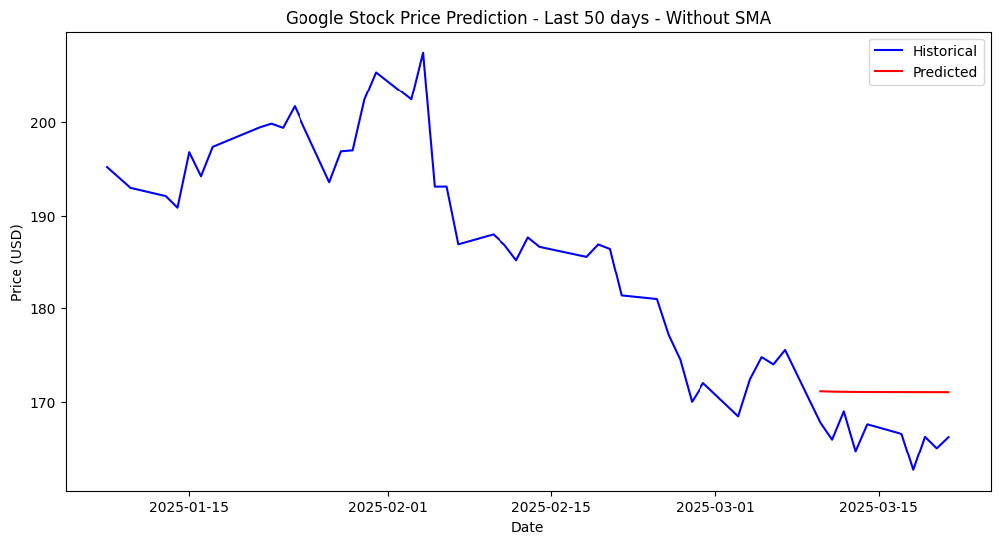

In [61]:
predict_future_days(df, model_simple, features_simple, scaler_simple, X_test_simple, 'Without SMA', 'no_sma')


Google Stock Price Predictions for Next 10 Days (5D):
      Date  Actual Price  Predicted Price
2025-03-10        167.81           171.21
2025-03-11        165.98           171.18
2025-03-12        169.00           171.16
2025-03-13        164.73           171.14
2025-03-14        167.62           171.13
2025-03-17        166.57           171.13
2025-03-18        162.67           171.13
2025-03-19        166.28           171.12
2025-03-20        165.05           171.12
2025-03-21        166.25           171.12
5D MSE: 27.31
5D MAE: 4.95
5D RMSE: 5.23
5D R²: -8.5534
5D MAPE: 2.99%


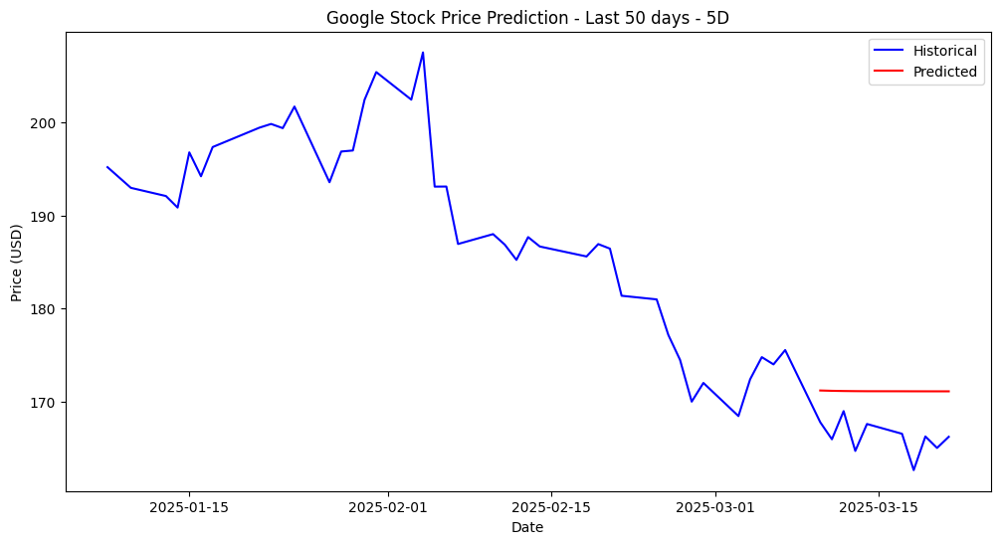

In [62]:
predict_future_days(df, model_5d, features_5d, scaler_5d, X_test_5d, '5D', '5d_sma')


Google Stock Price Predictions for Next 10 Days (7D):
      Date  Actual Price  Predicted Price
2025-03-10        167.81           171.13
2025-03-11        165.98           171.05
2025-03-12        169.00           171.00
2025-03-13        164.73           170.97
2025-03-14        167.62           170.95
2025-03-17        166.57           170.94
2025-03-18        162.67           170.93
2025-03-19        166.28           170.92
2025-03-20        165.05           170.92
2025-03-21        166.25           170.92
7D MSE: 25.57
7D MAE: 4.78
7D RMSE: 5.06
7D R²: -7.9452
7D MAPE: 2.88%


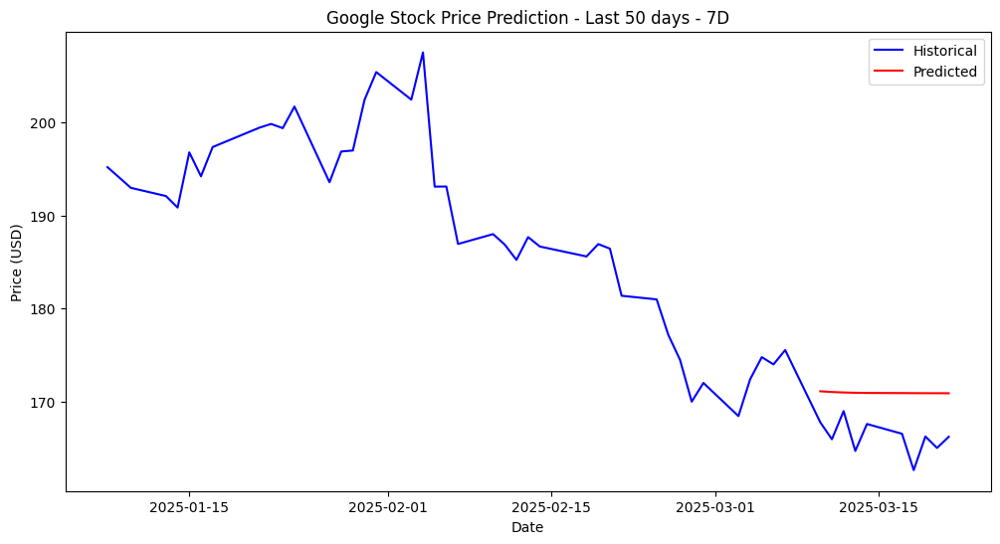

In [63]:
predict_future_days(df, model_7d, features_7d, scaler_7d, X_test_7d, '7D', '7d_sma')


Google Stock Price Predictions for Next 10 Days (9D):
      Date  Actual Price  Predicted Price
2025-03-10        167.81           174.29
2025-03-11        165.98           174.61
2025-03-12        169.00           174.83
2025-03-13        164.73           174.96
2025-03-14        167.62           175.05
2025-03-17        166.57           175.11
2025-03-18        162.67           175.15
2025-03-19        166.28           175.18
2025-03-20        165.05           175.19
2025-03-21        166.25           175.20
9D MSE: 80.13
9D MAE: 8.76
9D RMSE: 8.95
9D R²: -27.0317
9D MAPE: 5.28%


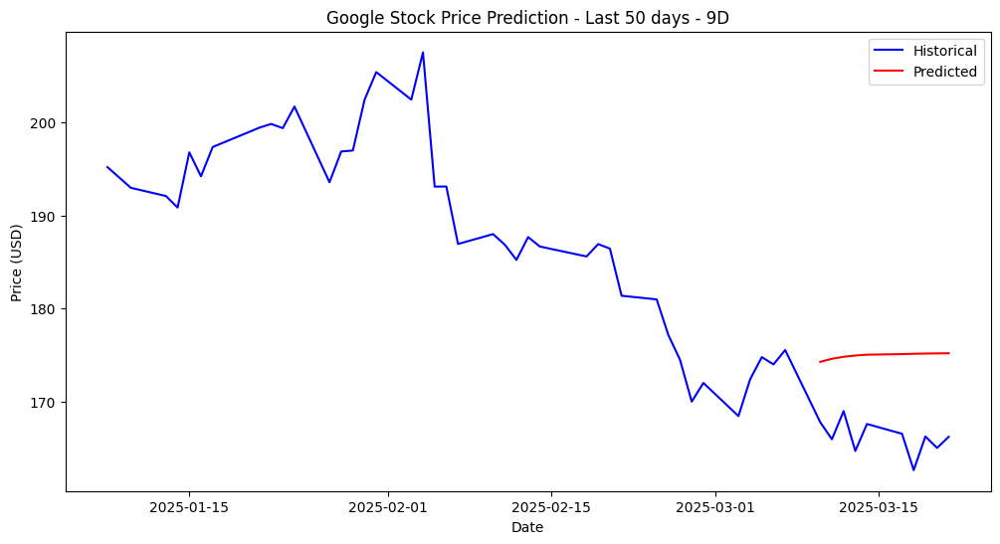

In [64]:
predict_future_days(df, model_9d, features_9d, scaler_9d, X_test_9d, '9D', '9d_sma')


Google Stock Price Predictions for Next 10 Days (11D):
      Date  Actual Price  Predicted Price
2025-03-10        167.81           174.36
2025-03-11        165.98           174.71
2025-03-12        169.00           174.93
2025-03-13        164.73           175.08
2025-03-14        167.62           175.17
2025-03-17        166.57           175.23
2025-03-18        162.67           175.27
2025-03-19        166.28           175.29
2025-03-20        165.05           175.31
2025-03-21        166.25           175.32
11D MSE: 82.08
11D MAE: 8.87
11D RMSE: 9.06
11D R²: -27.7139
11D MAPE: 5.35%


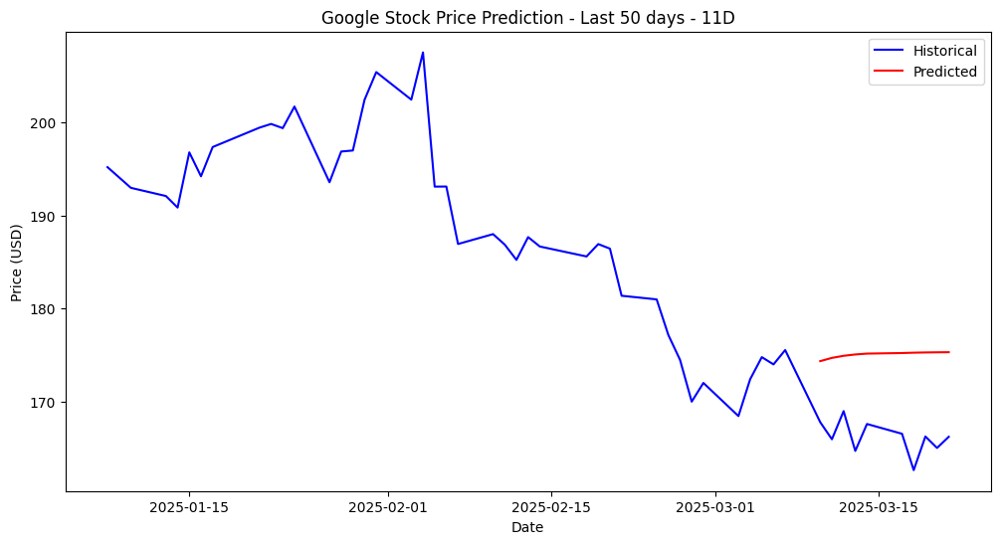

In [65]:
predict_future_days(df, model_11d, features_11d, scaler_11d, X_test_11d, '11D', '11d_sma')


Google Stock Price Predictions for Next 10 Days (13D):
      Date  Actual Price  Predicted Price
2025-03-10        167.81           170.22
2025-03-11        165.98           170.04
2025-03-12        169.00           169.92
2025-03-13        164.73           169.85
2025-03-14        167.62           169.80
2025-03-17        166.57           169.77
2025-03-18        162.67           169.75
2025-03-19        166.28           169.74
2025-03-20        165.05           169.73
2025-03-21        166.25           169.73
13D MSE: 16.04
13D MAE: 3.66
13D RMSE: 4.01
13D R²: -4.6112
13D MAPE: 2.21%


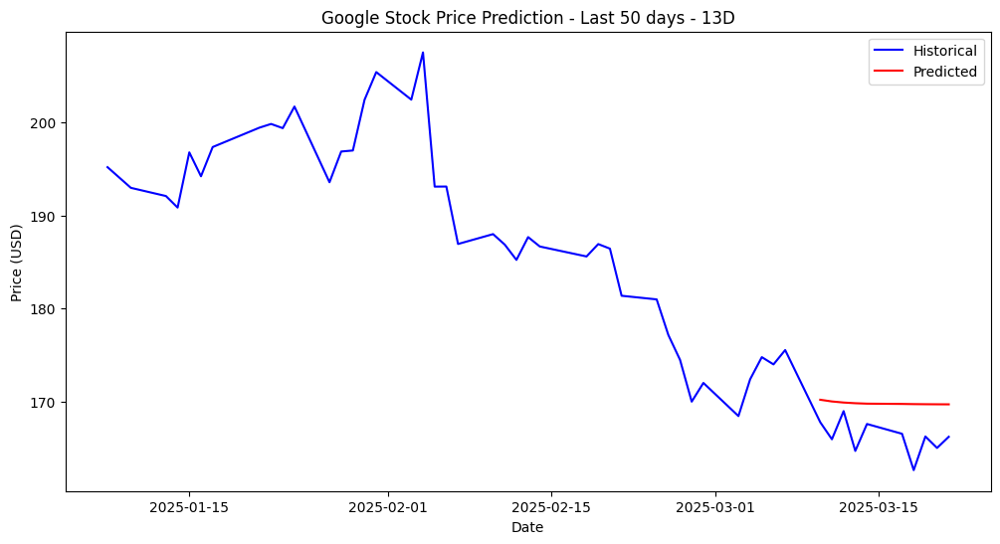

In [66]:
predict_future_days(df, model_13d, features_13d, scaler_13d, X_test_13d, '13D', '13d_sma')


Google Stock Price Predictions for Next 10 Days (15D):
      Date  Actual Price  Predicted Price
2025-03-10        167.81           170.83
2025-03-11        165.98           170.73
2025-03-12        169.00           170.66
2025-03-13        164.73           170.62
2025-03-14        167.62           170.59
2025-03-17        166.57           170.58
2025-03-18        162.67           170.57
2025-03-19        166.28           170.56
2025-03-20        165.05           170.56
2025-03-21        166.25           170.55
15D MSE: 22.35
15D MAE: 4.43
15D RMSE: 4.73
15D R²: -6.8200
15D MAPE: 2.68%


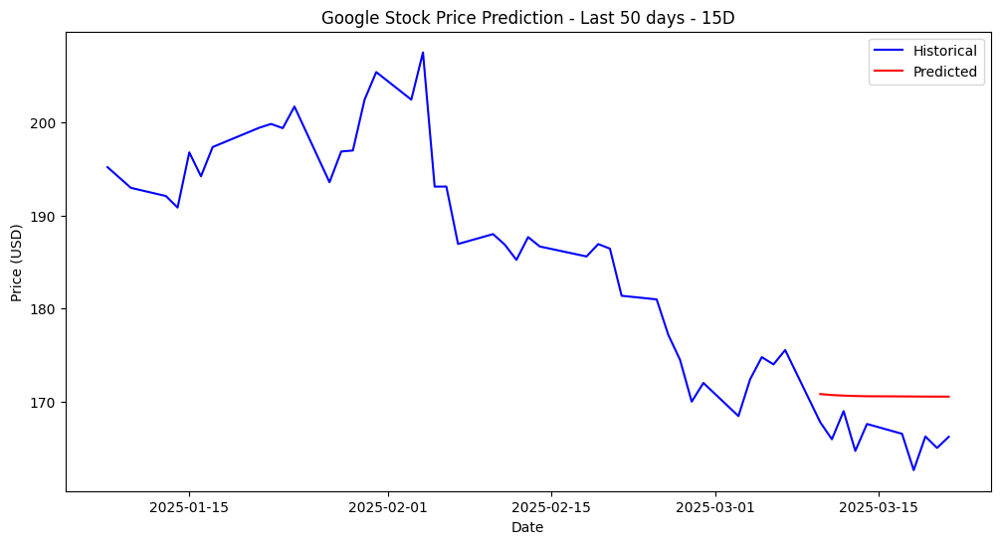

In [67]:
predict_future_days(df, model_15d, features_15d, scaler_15d, X_test_15d, '15D', '15d_sma')


Google Stock Price Predictions for Next 10 Days (17D):
      Date  Actual Price  Predicted Price
2025-03-10        167.81           167.83
2025-03-11        165.98           167.34
2025-03-12        169.00           167.03
2025-03-13        164.73           166.84
2025-03-14        167.62           166.71
2025-03-17        166.57           166.63
2025-03-18        162.67           166.58
2025-03-19        166.28           166.55
2025-03-20        165.05           166.53
2025-03-21        166.25           166.52
17D MSE: 2.87
17D MAE: 1.24
17D RMSE: 1.69
17D R²: -0.0027
17D MAPE: 0.75%


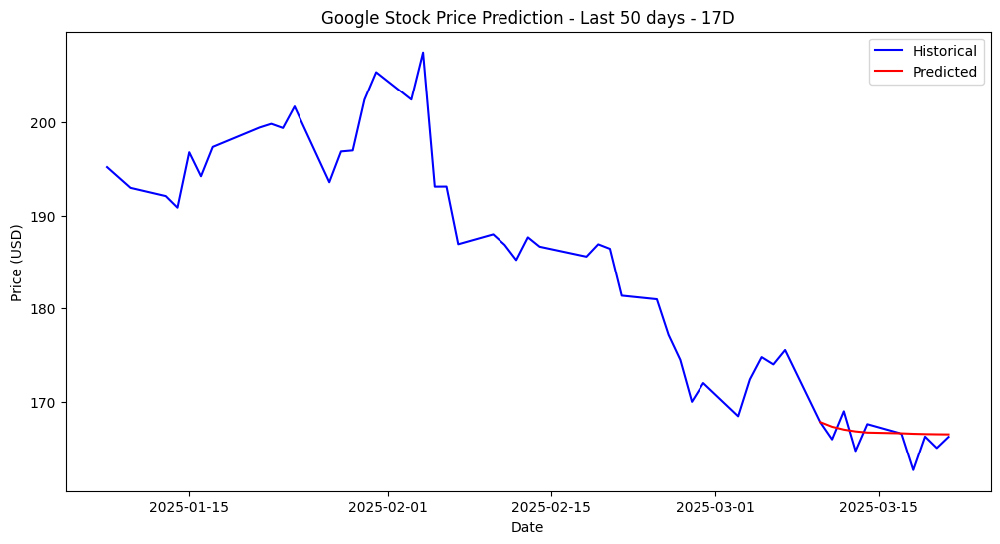

In [68]:
predict_future_days(df, model_17d, features_17d, scaler_17d, X_test_17d, '17D', '17d_sma')


Google Stock Price Predictions for Next 10 Days (ALL):
      Date  Actual Price  Predicted Price
2025-03-10        167.81           168.71
2025-03-11        165.98           168.33
2025-03-12        169.00           168.11
2025-03-13        164.73           167.98
2025-03-14        167.62           167.90
2025-03-17        166.57           167.85
2025-03-18        162.67           167.82
2025-03-19        166.28           167.81
2025-03-20        165.05           167.80
2025-03-21        166.25           167.79
ALL MSE: 5.83
ALL MAE: 1.99
ALL RMSE: 2.41
ALL R²: -1.0377
ALL MAPE: 1.21%


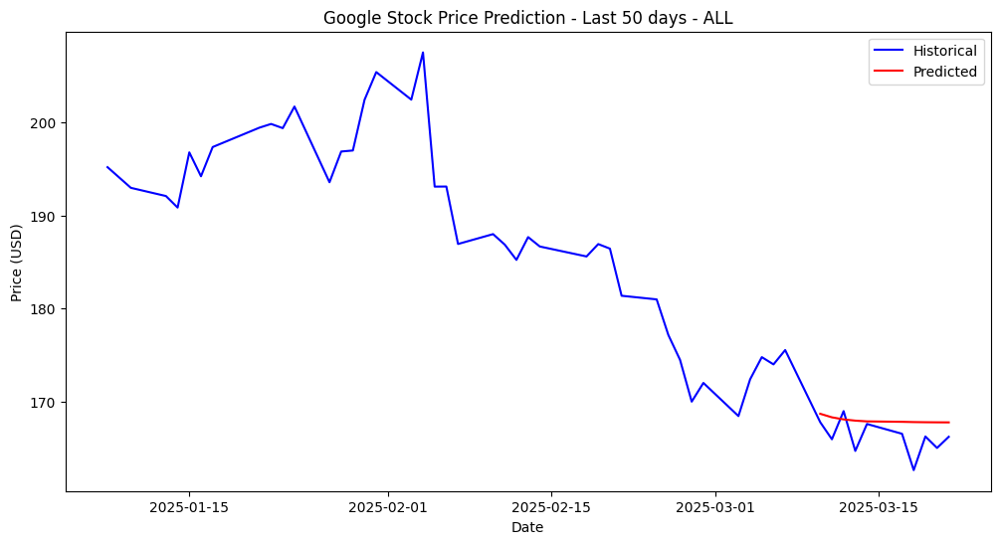

In [69]:
predict_future_days(df, model_all, features_all, scaler_all, X_test_all, 'ALL', 'all_sma')

## Combining Models (Best SMAs)

Models with MAPE < 3.0 are selected automatically.

- **Features**: 'Open', 'High', 'Low', 'Close', ...
- **Process**: Trains, evaluates, predicts.
- **Visualization**: Candlestick chart with best SMAs.

In [70]:
print(f'The selected models: {the_best_models_list}')

The selected models: ['5d_sma', '7d_sma', '9d_sma', '11d_sma', '13d_sma', '15d_sma']


In [71]:
# Feature selection and normalization
features_best = ['Open', 'High', 'Low', 'Close'] + the_best_models_list
train_loader_best, test_loader_best, X_train_best, X_test_best, y_train_best, y_test_best, scaler_best = feature_selection(df, features_best)

torch.Size([1810, 45, 10]) torch.Size([453, 45, 10])
torch.Size([1810]) torch.Size([453])


In [72]:
model_best = StockLSTM(input_size=len(features_best), dropout=DROPOUT_RATE).to(device)

/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning:

dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.3 and num_layers=1



Epoch 50, The Best SMAs Train Loss: 0.0008, Val Loss: 0.0009
Epoch 100, The Best SMAs Train Loss: 0.0007, Val Loss: 0.0015
Epoch 150, The Best SMAs Train Loss: 0.0005, Val Loss: 0.0007
Epoch 200, The Best SMAs Train Loss: 0.0004, Val Loss: 0.0007
Epoch 250, The Best SMAs Train Loss: 0.0004, Val Loss: 0.0008
Epoch 300, The Best SMAs Train Loss: 0.0003, Val Loss: 0.0005
Epoch 350, The Best SMAs Train Loss: 0.0004, Val Loss: 0.0014
Epoch 400, The Best SMAs Train Loss: 0.0004, Val Loss: 0.0005
Epoch 450, The Best SMAs Train Loss: 0.0004, Val Loss: 0.0005
Epoch 500, The Best SMAs Train Loss: 0.0004, Val Loss: 0.0007
Epoch 550, The Best SMAs Train Loss: 0.0004, Val Loss: 0.0006
Epoch 600, The Best SMAs Train Loss: 0.0004, Val Loss: 0.0006
Early stopping triggered


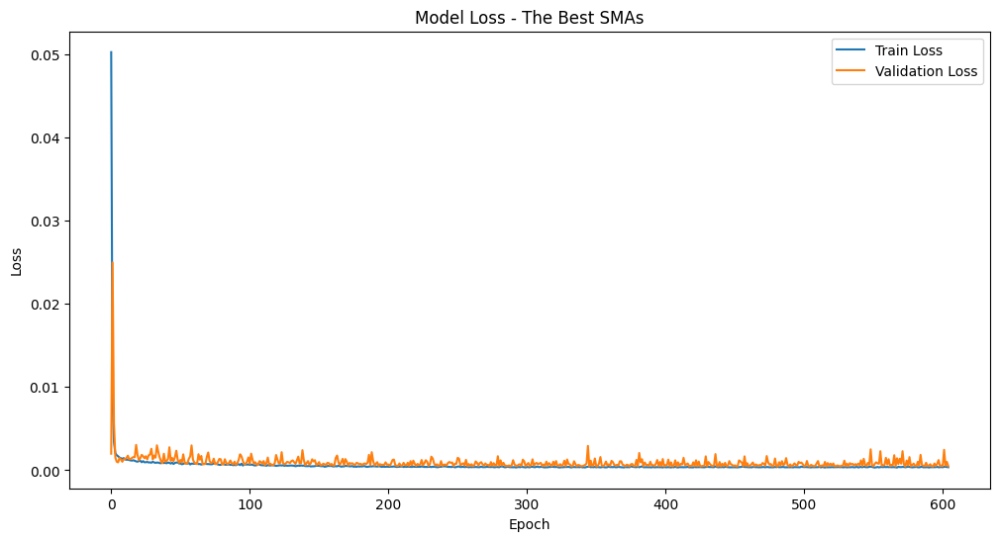

In [73]:
train_loss_best, val_loss_best = train_model(model_best, train_loader_best, test_loader_best, 'The Best SMAs')
plot_model_data(train_loss_best, val_loss_best, 'The Best SMAs')

The Best SMAs MAE: 2.73
The Best SMAs MSE: 13.33
The Best SMAs RMSE: 3.65
The Best SMAs R² Score: 0.9751
The Best SMAs Directional Accuracy: 46.46%
The Best SMAs MAPE: 1.74%


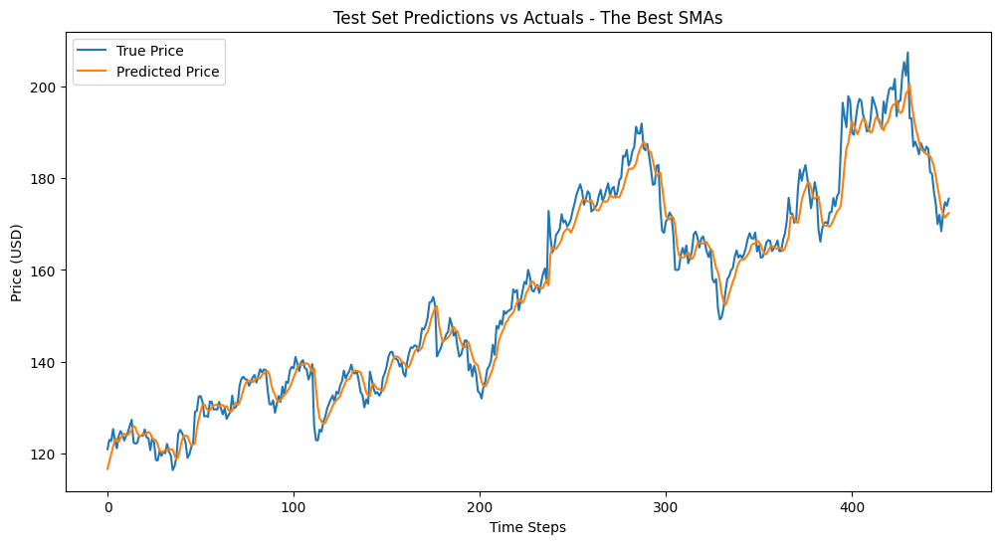

In [74]:
evaluate_model(model_best, features_best, scaler_best, X_test_best, y_test_best, 'The Best SMAs', 'best_sma')


Google Stock Price Predictions for Next 10 Days (The Best SMAs):
      Date  Actual Price  Predicted Price
2025-03-10        167.81           172.44
2025-03-11        165.98           172.48
2025-03-12        169.00           172.50
2025-03-13        164.73           172.52
2025-03-14        167.62           172.53
2025-03-17        166.57           172.53
2025-03-18        162.67           172.54
2025-03-19        166.28           172.54
2025-03-20        165.05           172.54
2025-03-21        166.25           172.54
The Best SMAs MSE: 42.83
The Best SMAs MAE: 6.32
The Best SMAs RMSE: 6.54
The Best SMAs R²: -13.9832
The Best SMAs MAPE: 3.81%


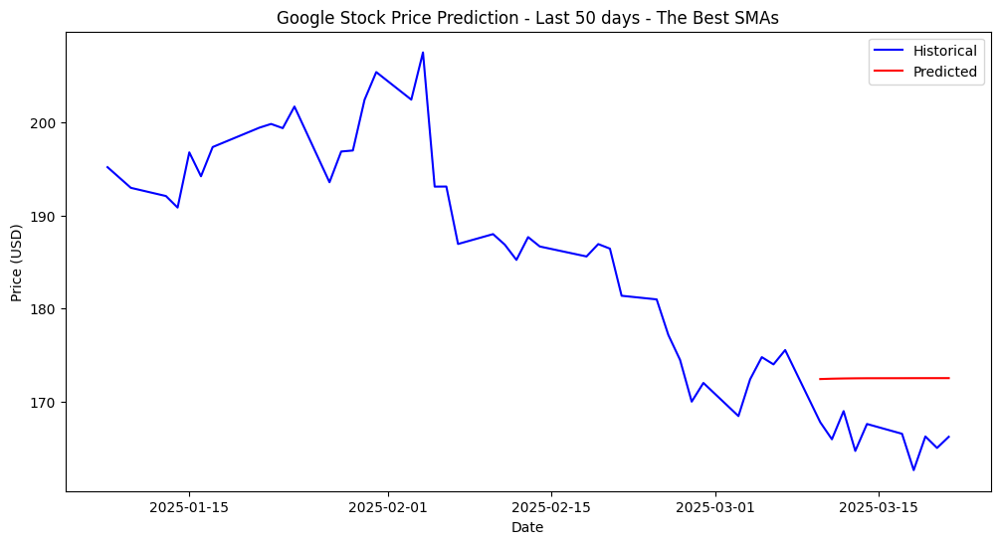

In [75]:
predict_future_days(df, model_best, features_best, scaler_best, X_test_best, 'The Best SMAs', 'best_sma')

In [76]:
# Create the candlestick chart
fig = go.Figure(data=[go.Candlestick(
    x=plot_df['Date'],  # Date on the x-axis
    open=plot_df['Open'],  # Open prices
    high=plot_df['High'],  # High prices
    low=plot_df['Low'],  # Low prices
    close=plot_df['Close'],  # Close prices
    name='Google Stock Market in 2025'
)])

# Customize the layout
fig.update_layout(
    title='Google Stock Price History - 2025 - The Best SMA Models',
    xaxis_title='Date',
    yaxis_title='Price (USD)',
    xaxis_rangeslider_visible=False
)

colors = ['blue', 'orange', 'red', 'purple', 'brown', 'pink', 'gray']
fig.add_trace(go.Scatter(x=plot_df['Date'], y=plot_df['Close'], line_color='green', name='Close', mode='lines'))

for i, item in enumerate(the_best_models_list):
    fig.add_trace(go.Scatter(x=plot_df['Date'], y=plot_df[item], line_color=colors[i], name='-'.join(item.upper().split('_')), mode='lines'))

# Show the plot
display(HTML(fig.to_html(include_plotlyjs=True)))

## The Best Models based on Future Predictions

Models Future Predictions with MAPE < 2.0 are selected automatically.
- **Features**: 'Open', 'High', 'Low', 'Close', ...
- **Process**: Trains, evaluates, predicts.
- **Visualization**: Candlestick chart with the best SMAs based on future predictions.

These combinations aim to enhance prediction accuracy.

In [77]:
print(f'The selected models based on predictions: {the_best_future_models_list}')

The selected models based on predictions: ['17d_sma']


In [78]:
# Feature selection and normalization
features_future_best = ['Open', 'High', 'Low', 'Close'] + the_best_future_models_list
train_loader_future_best, test_loader_future_best, X_train_future_best, X_test_future_best, y_train_future_best, y_test_future_best, scaler_future_best = feature_selection(df, features_future_best)

torch.Size([1810, 45, 5]) torch.Size([453, 45, 5])
torch.Size([1810]) torch.Size([453])


In [79]:
model_future_best = StockLSTM(input_size=len(features_future_best), dropout=DROPOUT_RATE).to(device)

/usr/local/lib/python3.10/dist-packages/torch/nn/modules/rnn.py:123: UserWarning:

dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.3 and num_layers=1



Epoch 50, future_best SMA Train Loss: 0.0007, Val Loss: 0.0023
Epoch 100, future_best SMA Train Loss: 0.0005, Val Loss: 0.0010
Epoch 150, future_best SMA Train Loss: 0.0004, Val Loss: 0.0022
Epoch 200, future_best SMA Train Loss: 0.0004, Val Loss: 0.0008
Epoch 250, future_best SMA Train Loss: 0.0003, Val Loss: 0.0009
Epoch 300, future_best SMA Train Loss: 0.0004, Val Loss: 0.0004
Epoch 350, future_best SMA Train Loss: 0.0004, Val Loss: 0.0011
Epoch 400, future_best SMA Train Loss: 0.0004, Val Loss: 0.0006
Epoch 450, future_best SMA Train Loss: 0.0004, Val Loss: 0.0011
Epoch 500, future_best SMA Train Loss: 0.0004, Val Loss: 0.0005
Epoch 550, future_best SMA Train Loss: 0.0003, Val Loss: 0.0012
Early stopping triggered


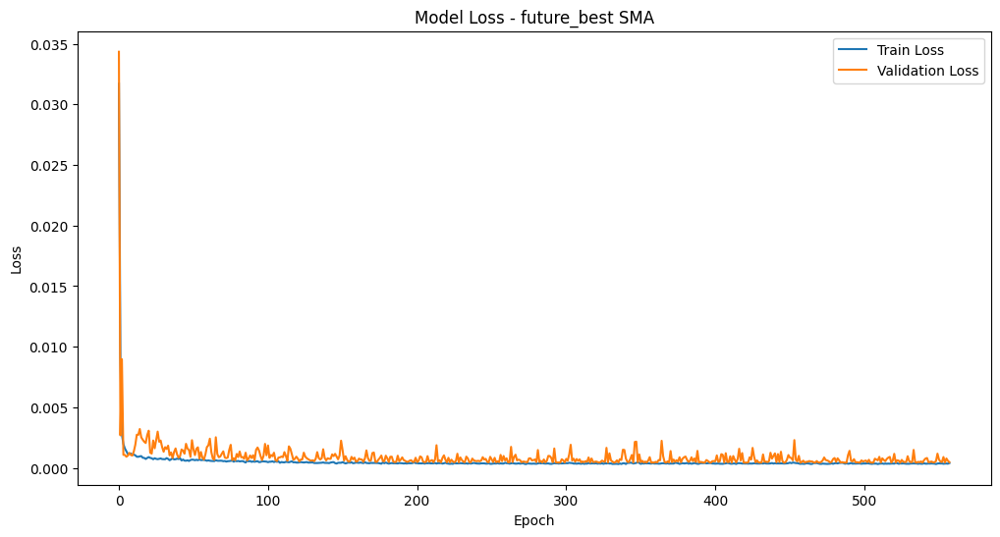

In [80]:
train_loss_future_best, val_loss_future_best = train_model(model_future_best, train_loader_future_best, test_loader_future_best, 'future_best SMA')
plot_model_data(train_loss_future_best, val_loss_future_best, 'future_best SMA')

The Best Future SMAs MAE: 2.65
The Best Future SMAs MSE: 12.51
The Best Future SMAs RMSE: 3.54
The Best Future SMAs R² Score: 0.9767
The Best Future SMAs Directional Accuracy: 46.90%
The Best Future SMAs MAPE: 1.69%


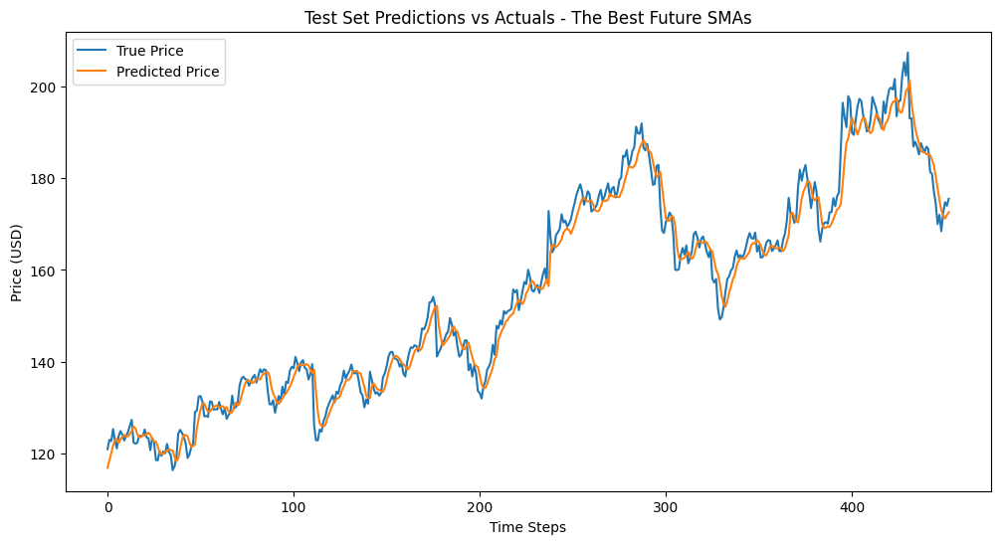

In [81]:
evaluate_model(model_future_best, features_future_best, scaler_future_best, X_test_future_best, y_test_future_best, 'The Best Future SMAs', 'best_future_sma')


Google Stock Price Predictions for Next 10 Days (The Best Future SMAs):
      Date  Actual Price  Predicted Price
2025-03-10        167.81           172.60
2025-03-11        165.98           172.73
2025-03-12        169.00           172.82
2025-03-13        164.73           172.87
2025-03-14        167.62           172.91
2025-03-17        166.57           172.93
2025-03-18        162.67           172.95
2025-03-19        166.28           172.96
2025-03-20        165.05           172.96
2025-03-21        166.25           172.97
The Best Future SMAs MSE: 47.57
The Best Future SMAs MAE: 6.67
The Best Future SMAs RMSE: 6.90
The Best Future SMAs R²: -15.6412
The Best Future SMAs MAPE: 4.03%


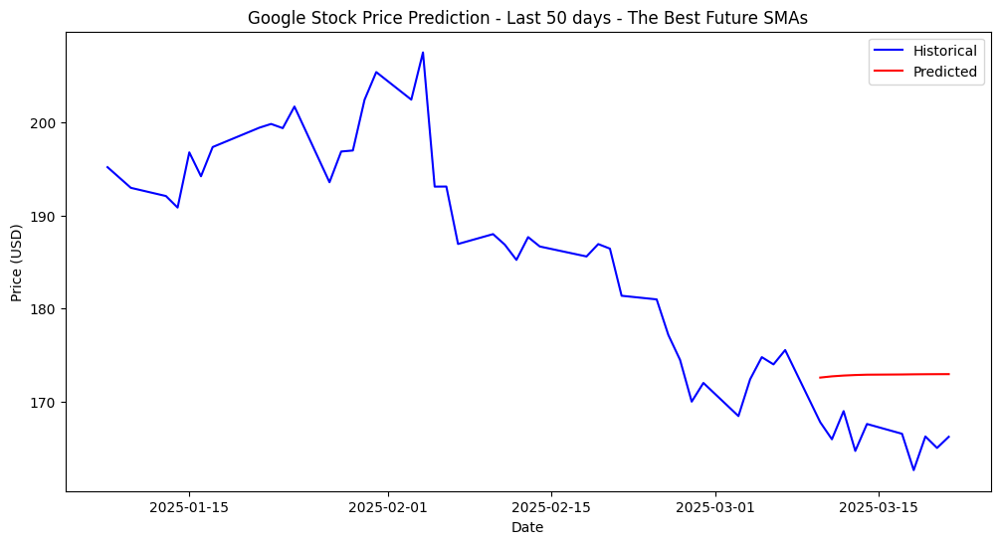

In [82]:
predict_future_days(df, model_future_best, features_future_best, scaler_future_best, X_test_future_best, 'The Best Future SMAs', 'best_future_sma')

In [83]:
# Create the candlestick chart
fig = go.Figure(data=[go.Candlestick(
    x=plot_df['Date'],  # Date on the x-axis
    open=plot_df['Open'],  # Open prices
    high=plot_df['High'],  # High prices
    low=plot_df['Low'],  # Low prices
    close=plot_df['Close'],  # Close prices
    name='Google Stock Market in 2025'
)])

# Customize the layout
fig.update_layout(
    title='Google Stock Price History - 2025 - The Best Future SMA Models',
    xaxis_title='Date',
    yaxis_title='Price (USD)',
    xaxis_rangeslider_visible=False
)

fig.add_trace(go.Scatter(x=plot_df['Date'], y=plot_df['Close'], line_color='green', name='Close', mode='lines'))

for i, item in enumerate(the_best_future_models_list):
    fig.add_trace(go.Scatter(x=plot_df['Date'], y=plot_df[item], line_color=colors[i], name='-'.join(item.upper().split('_')), mode='lines'))

# Show the plot
display(HTML(fig.to_html(include_plotlyjs=True)))

## 
Summary

This notebook explores the use of Long Short-Term Memory (LSTM) neural networks to predict Google stock prices, focusing on the impact of different Simple Moving Average (SMA) configurations. The analysis includes several models:

- **Baseline Model**: An LSTM model without SMAs.
- **Individual SMA Models**: Models incorporating SMAs with window sizes of 5, 7, 9, 11, 13, 15, and 17 days.
- **Combined SMA Model**: A model using all SMA window sizes together.
- **Top-Performing SMA Model**: Two models combining the best-performing SMAs from the individual tests.

The models are evaluated using key metrics:
- Mean Absolute Error (MAE)
- Mean Squared Error (MSE)
- Root Mean Squared Error (RMSE)
- R² Score
- Mean Absolute Percentage Error (MAPE)
- Directional Accuracy


### Visualizations
Interactive candlestick charts overlaid with SMA trends are included to highlight price movements and model performance, offering clear visual insights into the effectiveness of the SMA-enhanced predictions.

### Conclusion
Incorporating multiple SMAs into LSTM models significantly improves stock price forecasting accuracy. This approach provides a robust framework for understanding market trends and can be a valuable tool for financial analysis.